In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

In [2]:
data = pd.read_csv('csv/image_bins_stats_lungs1.csv')
data.shape

(2484, 106)

In [3]:
data.head()

,filename,Bins0,Bins1,Bins2,Bins3,Bins4,Bins5,Bins6,Bins7,rmean_bins0,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
0,transformed_image_covid_1.png,4722,15567,4,7683,12061,1,8864,16634,77.433079,...,29.26670025,39.092067,21.915792,15.564234,10.232452,12.530200,0.000000,40.674295,31.538221,0
1,transformed_image_covid_2.png,6556,13701,25,9956,9437,0,12114,13747,79.728951,...,33.53821958,28.281468,23.127681,11.979449,17.519198,24.313131,0.000000,38.506228,36.562100,0
2,transformed_image_covid_3.png,10512,12249,1,11502,7743,2,9619,13908,68.987348,...,25.22521593,26.681675,24.442798,0.000000,12.323460,38.083555,4.204482,55.658016,27.952446,0
3,transformed_image_covid_4.png,7987,11854,2,10419,11895,9,11931,11439,94.638788,...,34.51618537,24.056261,28.558353,0.840896,13.800903,27.757483,33.449086,44.809595,37.884099,0
4,transformed_image_covid_5.png,7761,14159,4,10898,10560,9,9153,12992,68.762015,...,32.13721328,27.884767,23.329477,13.445587,16.742312,28.738945,26.135224,49.330295,35.162254,0


In [4]:
data = data.drop(['filename'], axis=1)

In [5]:
data.head()

,Bins0,Bins1,Bins2,Bins3,Bins4,Bins5,Bins6,Bins7,rmean_bins0,rmean_bins1,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
0,4722,15567,4,7683,12061,1,8864,16634,77.433079,0.202929,...,29.26670025,39.092067,21.915792,15.564234,10.232452,12.530200,0.000000,40.674295,31.538221,0
1,6556,13701,25,9956,9437,0,12114,13747,79.728951,5.447851,...,33.53821958,28.281468,23.127681,11.979449,17.519198,24.313131,0.000000,38.506228,36.562100,0
2,10512,12249,1,11502,7743,2,9619,13908,68.987348,36.388358,...,25.22521593,26.681675,24.442798,0.000000,12.323460,38.083555,4.204482,55.658016,27.952446,0
3,7987,11854,2,10419,11895,9,11931,11439,94.638788,15.529948,...,34.51618537,24.056261,28.558353,0.840896,13.800903,27.757483,33.449086,44.809595,37.884099,0
4,7761,14159,4,10898,10560,9,9153,12992,68.762015,4.809379,...,32.13721328,27.884767,23.329477,13.445587,16.742312,28.738945,26.135224,49.330295,35.162254,0


In [6]:
name = ['rstd_bins0','rstd_bins1','rstd_bins2','rstd_bins3','rstd_bins4','rstd_bins5','rstd_bins6','rstd_bins7','gstd_bins0','gstd_bins1','gstd_bins2','gstd_bins3','gstd_bins4','gstd_bins5','gstd_bins6','gstd_bins7','bstd_bins0','bstd_bins1','bstd_bins2','bstd_bins3','bstd_bins4','bstd_bins5','bstd_bins6','bstd_bins7','gskew_bins0','gskew_bins1','gskew_bins2','gskew_bins3','gskew_bins4','gskew_bins5','gskew_bins6','gskew_bins7','bskew_bins0','bskew_bins1','bskew_bins2','bskew_bins3','bskew_bins4','bskew_bins5','bskew_bins6','bskew_bins7','class']
for i in name:
    data[i] = pd.to_numeric(data[i],errors='coerce')

In [7]:
import numpy as np
def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    return df[indices_to_keep].astype(np.float64)

clean_dataset(data)

,Bins0,Bins1,Bins2,Bins3,Bins4,Bins5,Bins6,Bins7,rmean_bins0,rmean_bins1,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
0,4722.0,15567.0,4.0,7683.0,12061.0,1.0,8864.0,16634.0,77.433079,0.202929,...,29.266700,39.092067,21.915792,15.564234,10.232452,12.530200,0.000000,40.674295,31.538221,0.0
1,6556.0,13701.0,25.0,9956.0,9437.0,0.0,12114.0,13747.0,79.728951,5.447851,...,33.538220,28.281468,23.127681,11.979449,17.519198,24.313131,0.000000,38.506228,36.562100,0.0
2,10512.0,12249.0,1.0,11502.0,7743.0,2.0,9619.0,13908.0,68.987348,36.388358,...,25.225216,26.681675,24.442798,0.000000,12.323460,38.083555,4.204482,55.658016,27.952446,0.0
3,7987.0,11854.0,2.0,10419.0,11895.0,9.0,11931.0,11439.0,94.638788,15.529948,...,34.516185,24.056261,28.558353,0.840896,13.800903,27.757483,33.449086,44.809595,37.884099,0.0
4,7761.0,14159.0,4.0,10898.0,10560.0,9.0,9153.0,12992.0,68.762015,4.809379,...,32.137213,27.884767,23.329477,13.445587,16.742312,28.738945,26.135224,49.330295,35.162254,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2479,4950.0,16941.0,0.0,9161.0,12953.0,0.0,8179.0,13352.0,59.237576,0.162269,...,25.786782,40.580961,22.391613,0.000000,6.716628,15.733760,0.000000,45.642531,33.442984,1.0
2480,6149.0,11217.0,1.0,10795.0,14813.0,0.0,7335.0,15226.0,89.067328,2.286262,...,30.321740,38.459722,19.856163,0.000000,7.773049,11.227728,0.000000,40.091211,34.380787,1.0
2481,8157.0,8955.0,3.0,8384.0,14395.0,0.0,8516.0,17126.0,110.959421,12.390955,...,30.361398,40.138990,24.611149,8.738112,13.053664,9.750293,0.000000,32.766410,38.228325,1.0
2482,6614.0,11508.0,3.0,10639.0,14738.0,0.0,7195.0,14839.0,90.745086,4.628172,...,35.209322,29.755901,22.888434,14.582557,13.300365,13.399057,0.000000,41.964578,34.453684,1.0


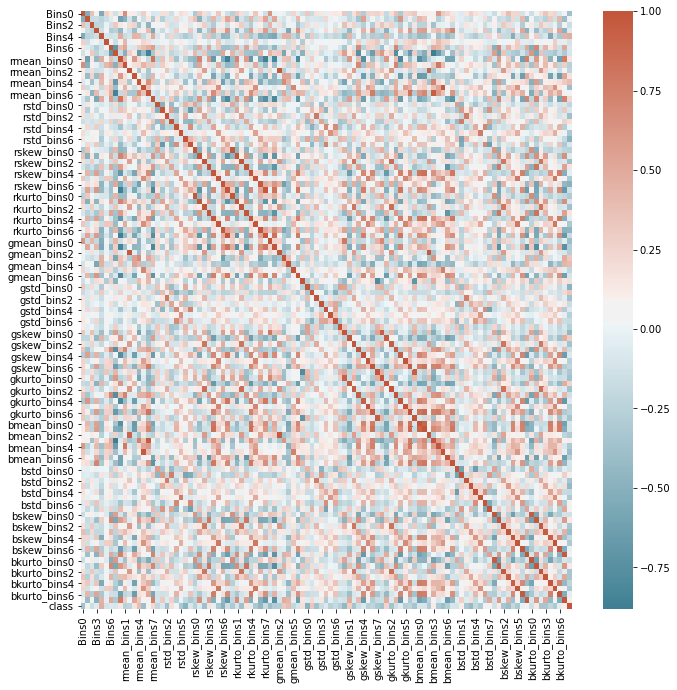

In [8]:
# visualise correlated features:

# I will build a correlation matrix, which examines the 
# correlation of all features (that is, for all possible feature combinations)
# and then visualise the correlation matrix using a heatmap

# the default correlation method of pandas.corr is pearson
# I include it anyways for the demo
corrmat = data.corr(method='pearson')

# we can make a heatmap with the package seaborn
# and customise the colours of searborn's heatmap
cmap = sns.diverging_palette(220, 20, as_cmap=True)

# some more parameters for the figure
fig, ax = plt.subplots()
fig.set_size_inches(11,11)

# and now plot the correlation matrix
sns.heatmap(corrmat, cmap=cmap)

In [9]:
# build a dataframe with the correlation between features
# remember that the absolute value of the correlation
# coefficient is important and not the sign

corrmat = data.corr()
corrmat = corrmat.abs().unstack() # absolute value of corr coef
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat[corrmat >= 0.8]
corrmat = corrmat[corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1', 'feature2', 'corr']
corrmat.head()

,feature1,feature2,corr
0,rkurto_bins5,rskew_bins5,0.999076
1,rskew_bins5,rkurto_bins5,0.999076
2,rkurto_bins2,rskew_bins2,0.999014
3,rskew_bins2,rkurto_bins2,0.999014
4,bskew_bins5,bkurto_bins5,0.997892


In [10]:
# find groups of correlated features

grouped_feature_ls = []
correlated_groups = []

for feature in corrmat.feature1.unique():
    
    if feature not in grouped_feature_ls:

        # find all features correlated to a single feature
        correlated_block = corrmat[corrmat.feature1 == feature]
        grouped_feature_ls = grouped_feature_ls + list(
            correlated_block.feature2.unique()) + [feature]

        # append the block of features to the list
        correlated_groups.append(correlated_block)

print('found {} correlated groups'.format(len(correlated_groups)))
print('out of {} total features'.format(data.shape[1]))

found 25 correlated groups
out of 105 total features


In [11]:
# now we can print out each group. We see that some groups contain
# only 2 correlated features, some other groups present several features 
# that are correlated among themselves.

for group in correlated_groups:
    print(group)
    print()

       feature1     feature2      corr
0  rkurto_bins5  rskew_bins5  0.999076

         feature1      feature2      corr
2    rkurto_bins2   rskew_bins2  0.999014
73   rkurto_bins2  gkurto_bins2  0.847941
102  rkurto_bins2   gskew_bins2  0.810192
104  rkurto_bins2  bkurto_bins2  0.809574

      feature1      feature2      corr
4  bskew_bins5  bkurto_bins5  0.997892

       feature1     feature2      corr
6  gkurto_bins5  gskew_bins5  0.997824

         feature1      feature2      corr
8    rkurto_bins3   rskew_bins3  0.995553
83   rkurto_bins3  bkurto_bins1  0.827407
112  rkurto_bins3   bskew_bins1  0.807289

         feature1     feature2      corr
10   rkurto_bins4  rskew_bins4  0.994199
79   rkurto_bins4  bmean_bins1  0.841226
116  rkurto_bins4  bmean_bins0  0.806392

        feature1      feature2      corr
12   rskew_bins7  rkurto_bins7  0.992293
64   rskew_bins7   rmean_bins0  0.870944
87   rskew_bins7   gmean_bins1  0.823379
119  rskew_bins7  gkurto_bins4  0.804860
121  rskew_bi

In [12]:
# we can now investigate further features within one group.
# let's for example select group 0

group = correlated_groups[0]
group

,feature1,feature2,corr
0,rkurto_bins5,rskew_bins5,0.999076


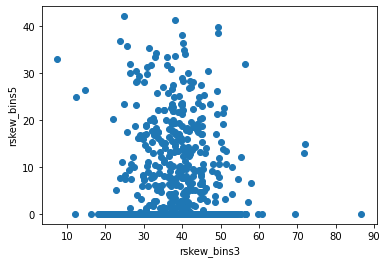

In [13]:
# BONUS:
# let's plot the correlation of the features in the correlated group from the
# previous cell

for feature in group['feature2']:
    plt.scatter(data['rskew_bins3'], data[feature])
    plt.xlabel('rskew_bins3')
    plt.ylabel(feature)
    plt.show()

In [14]:
X = data.iloc[:,:-1]  #independent columns
y = data.iloc[:,-1]    #target column i.e price range
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

[0.01302607 0.00587609 0.00284277 0.00593611 0.01696547 0.00229006
 0.00752749 0.0093148  0.00796242 0.00851886 0.00437007 0.0058086
 0.01028637 0.02591535 0.0065778  0.00838663 0.00839333 0.00526512
 0.01089935 0.00490267 0.00519584 0.00777508 0.02871925 0.00668229
 0.01237676 0.00559306 0.01599433 0.00633643 0.00501595 0.011554
 0.02836861 0.00943932 0.01814352 0.00677469 0.00801808 0.00611381
 0.0060975  0.00770146 0.01798449 0.00957782 0.02393988 0.01592777
 0.0060087  0.00966211 0.01685553 0.00702444 0.00519888 0.01261411
 0.0234463  0.01621662 0.00853534 0.00595953 0.0054183  0.0068378
 0.00831223 0.01221261 0.01477032 0.00992073 0.0088216  0.00610437
 0.00455551 0.00266994 0.01002458 0.01478436 0.01463429 0.01376692
 0.00912325 0.00696368 0.00661719 0.00672522 0.00958121 0.01535315
 0.00953355 0.00796189 0.00337708 0.00548225 0.01202362 0.02833554
 0.00529382 0.00828501 0.00485547 0.00854712 0.00734958 0.02165451
 0.00607449 0.00700504 0.00444126 0.00446041 0.00493909 0.01108454

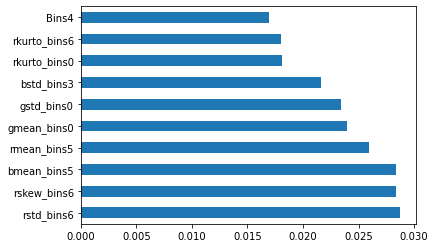

In [15]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

# Understanding the data:

In [16]:
data.describe()

,Bins0,Bins1,Bins2,Bins3,Bins4,Bins5,Bins6,Bins7,rmean_bins0,rmean_bins1,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
count,2476.000000,2476.000000,2476.000000,2476.000000,2476.000000,2476.000000,2476.000000,2476.000000,2476.000000,2476.000000,...,2476.000000,2476.000000,2476.000000,2476.000000,2476.000000,2476.000000,2476.000000,2476.000000,2476.000000,2476.000000
mean,7610.815428,12347.397819,7.308158,10664.026252,11972.813005,1.860258,8435.634087,14496.144992,81.648006,9.242404,...,30.066054,31.370606,22.122555,3.207491,12.483097,18.878647,1.734334,43.389495,33.112860,0.539580
std,2445.140003,2182.418795,42.822678,1980.845148,2784.533166,15.295469,2598.906512,2694.110235,20.402115,12.101710,...,5.223091,6.962941,4.685409,5.644718,3.655980,7.827541,5.555048,7.197423,5.530243,0.498532
min,3567.000000,3186.000000,0.000000,430.000000,0.000000,0.000000,0.000000,634.000000,6.959611,0.003088,...,4.356697,7.435075,6.374928,0.000000,3.431584,0.000000,0.000000,0.000000,7.434697,0.000000
25%,6257.000000,10989.750000,0.000000,9665.750000,10262.250000,0.000000,7061.750000,13306.750000,73.011468,2.802561,...,26.870451,26.889374,19.865883,0.000000,10.156932,12.931288,0.000000,39.937614,29.654272,0.000000
50%,6886.500000,12630.500000,0.000000,10715.000000,12314.500000,0.000000,7940.000000,14495.000000,82.747357,5.364382,...,29.553933,30.185453,22.289277,0.000000,11.608803,18.531559,0.000000,43.678766,32.622715,1.000000
75%,8187.500000,13829.500000,3.000000,11751.250000,14046.500000,0.000000,9016.000000,15689.500000,93.081314,10.119612,...,32.634481,35.000146,24.556020,4.624930,13.925758,24.432457,0.000000,47.138982,35.962306,1.000000
max,28070.000000,19333.000000,1227.000000,18614.000000,19172.000000,489.000000,36176.000000,28759.000000,169.832685,130.097152,...,59.002092,64.348561,47.254294,30.957677,40.018307,58.796364,46.669751,65.854665,63.115967,1.000000


In [17]:
data_desc = data.describe()
a = pd.DataFrame(data_desc.loc['mean'])

## Red Channel:

In [18]:
r = pd.read_csv('csv/image_bins_stats_lungs_r.csv')
r = r.drop(['filename'], axis=1)

In [19]:
r.describe()

,rmean_bins0,rmean_bins1,rmean_bins2,rmean_bins3,rmean_bins4,rmean_bins5,rmean_bins6,rmean_bins7,rskew_bins0,rskew_bins1,...,rskew_bins7,rkurto_bins0,rkurto_bins1,rkurto_bins2,rkurto_bins3,rkurto_bins4,rkurto_bins5,rkurto_bins6,rkurto_bins7,class
count,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,...,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000
mean,81.668029,9.236433,51.510577,68.443197,178.475566,33.225260,220.226532,203.160931,29.542433,14.594476,...,40.919092,32.096482,17.734600,3.215087,39.647914,27.509987,2.071589,15.490758,44.411986,0.539855
std,20.409385,12.100740,56.929818,11.249104,14.114148,64.520278,13.986620,11.193585,5.423364,6.429886,...,5.689056,5.684051,6.714095,5.702578,6.360220,7.421884,6.475758,5.042868,5.798852,0.498509
min,6.959611,0.003088,0.000000,14.814187,0.000000,0.000000,0.000000,133.633967,5.518590,0.427824,...,5.992131,6.726050,0.806916,0.000000,10.498661,0.000000,0.000000,0.000000,10.690092,0.000000
25%,73.011468,2.785924,0.000000,61.423110,171.963257,0.000000,213.210838,197.972478,26.622160,9.875329,...,38.310998,28.826540,12.895316,0.000000,36.181121,23.554620,0.000000,12.249956,41.642803,0.000000
50%,82.732796,5.353504,0.000000,68.092916,180.262447,0.000000,220.710972,204.028113,28.603140,13.684760,...,41.251502,30.980522,16.949470,0.000000,39.869717,27.411561,0.000000,14.280450,44.674220,1.000000
75%,93.081314,10.116182,110.783333,74.391509,186.908169,0.000000,228.149405,208.899053,31.254293,18.208104,...,44.124466,34.060815,21.338864,4.711395,43.193751,31.262006,0.000000,17.560392,47.705882,1.000000
max,169.832685,130.097152,177.600000,135.890620,226.958716,255.000000,254.977637,254.740155,57.568369,45.909601,...,59.425730,62.853679,50.451022,30.541824,97.322633,67.675808,47.101455,38.934694,65.267407,1.000000


In [20]:
r.describe().loc['mean']

rmean_bins0      81.668029
rmean_bins1       9.236433
rmean_bins2      51.510577
rmean_bins3      68.443197
rmean_bins4     178.475566
rmean_bins5      33.225260
rmean_bins6     220.226532
rmean_bins7     203.160931
rskew_bins0      29.542433
rskew_bins1      14.594476
rskew_bins2       2.931652
rskew_bins3      36.931941
rskew_bins4      25.299297
rskew_bins5       1.900080
rskew_bins6      12.609815
rskew_bins7      40.919092
rkurto_bins0     32.096482
rkurto_bins1     17.734600
rkurto_bins2      3.215087
rkurto_bins3     39.647914
rkurto_bins4     27.509987
rkurto_bins5      2.071589
rkurto_bins6     15.490758
rkurto_bins7     44.411986
class             0.539855
Name: mean, dtype: float64

There is very high variance from column to columns which is not desired. Notice how variance from rmean_bins0 to 7 differs by high amount of values. rstd, rskew and rkurto are almost stable.

In [21]:
r.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2485 entries, 0 to 2484
Data columns (total 33 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   rmean_bins0   2484 non-null   float64
 1   rmean_bins1   2484 non-null   float64
 2   rmean_bins2   2484 non-null   float64
 3   rmean_bins3   2484 non-null   float64
 4   rmean_bins4   2484 non-null   float64
 5   rmean_bins5   2484 non-null   float64
 6   rmean_bins6   2484 non-null   float64
 7   rmean_bins7   2484 non-null   float64
 8   rstd_bins0    2485 non-null   object 
 9   rstd_bins1    2485 non-null   object 
 10  rstd_bins2    2485 non-null   object 
 11  rstd_bins3    2485 non-null   object 
 12  rstd_bins4    2485 non-null   object 
 13  rstd_bins5    2485 non-null   object 
 14  rstd_bins6    2485 non-null   object 
 15  rstd_bins7    2485 non-null   object 
 16  rskew_bins0   2484 non-null   float64
 17  rskew_bins1   2484 non-null   float64
 18  rskew_bins2   2484 non-null 

In [22]:
r.isnull().sum()

rmean_bins0     1
rmean_bins1     1
rmean_bins2     1
rmean_bins3     1
rmean_bins4     1
rmean_bins5     1
rmean_bins6     1
rmean_bins7     1
rstd_bins0      0
rstd_bins1      0
rstd_bins2      0
rstd_bins3      0
rstd_bins4      0
rstd_bins5      0
rstd_bins6      0
rstd_bins7      0
rskew_bins0     1
rskew_bins1     1
rskew_bins2     1
rskew_bins3     1
rskew_bins4     1
rskew_bins5     1
rskew_bins6     1
rskew_bins7     1
rkurto_bins0    1
rkurto_bins1    1
rkurto_bins2    1
rkurto_bins3    1
rkurto_bins4    1
rkurto_bins5    1
rkurto_bins6    1
rkurto_bins7    1
class           1
dtype: int64

In [23]:
name = ['rstd_bins0','rstd_bins1','rstd_bins2','rstd_bins3','rstd_bins4','rstd_bins5','rstd_bins6','rstd_bins7']
for i in name:
    r[i] = pd.to_numeric(data[i],errors='coerce')

In [24]:
import numpy as np
def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    return df[indices_to_keep].astype(np.float64)

clean_dataset(r)

,rmean_bins0,rmean_bins1,rmean_bins2,rmean_bins3,rmean_bins4,rmean_bins5,rmean_bins6,rmean_bins7,rstd_bins0,rstd_bins1,...,rskew_bins7,rkurto_bins0,rkurto_bins1,rkurto_bins2,rkurto_bins3,rkurto_bins4,rkurto_bins5,rkurto_bins6,rkurto_bins7,class
0,77.433079,0.202929,117.250000,63.521281,178.310671,139.000000,205.646548,206.088073,32.784848,1.744964,...,42.500210,40.720362,8.193494,4.261464,41.106583,22.694095,0.000000,17.004224,47.409860,0.0
1,79.728951,5.447851,104.160000,56.566693,169.952739,0.000000,215.158907,205.409835,26.954667,10.640373,...,40.101168,34.348001,17.762946,20.177084,39.719298,23.463500,0.000000,25.116199,43.277063,0.0
2,68.987348,36.388358,99.000000,53.873761,186.847863,131.500000,225.237343,199.808024,13.952497,24.365109,...,41.953986,20.273658,27.656026,0.000000,42.266729,30.790070,2.943137,16.992796,44.770112,0.0
3,94.638788,15.529948,127.500000,61.566273,186.061370,151.777778,231.878803,216.705656,24.038022,19.072907,...,39.908807,29.200044,24.907534,3.784034,48.830315,25.174185,6.026026,14.344924,43.955093,0.0
4,68.762015,4.809379,86.000000,61.639475,186.671970,196.777778,230.412433,196.199123,29.339406,9.369216,...,43.764826,37.560258,17.588938,16.652925,40.270553,38.996435,25.143540,18.288944,46.734934,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2479,59.237576,0.162269,0.000000,73.818797,196.383695,0.000000,229.371561,202.083957,37.996218,1.986924,...,45.117551,42.766742,3.563538,0.000000,32.809212,32.286576,0.000000,13.288487,48.277316,1.0
2480,89.067328,2.286262,121.000000,68.821862,181.667454,0.000000,215.846762,205.722317,35.418661,1.063096,...,38.121479,33.473839,15.411386,0.000000,41.260594,25.678505,0.000000,11.282502,41.778918,1.0
2481,110.959421,12.390955,132.000000,77.791388,173.439250,0.000000,196.715359,211.790494,27.608635,7.522045,...,32.430741,31.087667,25.988918,4.628638,45.447751,15.573516,0.000000,10.116770,36.146990,1.0
2482,90.745086,4.628172,123.666667,74.198139,183.741688,0.000000,217.901042,204.657996,27.613624,19.319175,...,38.676855,28.413059,19.147318,11.128059,39.054362,27.106339,0.000000,12.731572,41.872884,1.0


In [25]:
r.duplicated().sum()

0

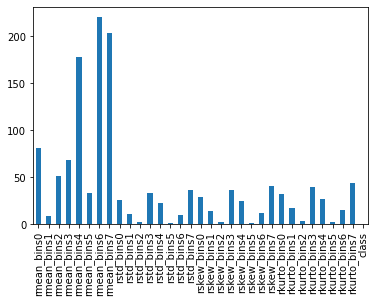

In [26]:
r.describe().loc['mean'].plot.bar()

From this graph, we come to know that these values require standardization and normalisation during ML training.

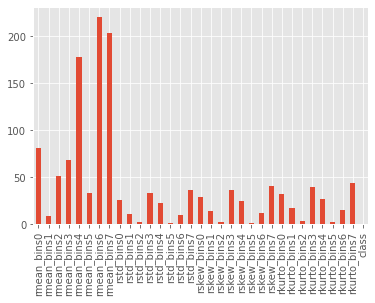

In [27]:
plt.style.use('ggplot')
r.describe().loc['mean'].plot.bar()

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


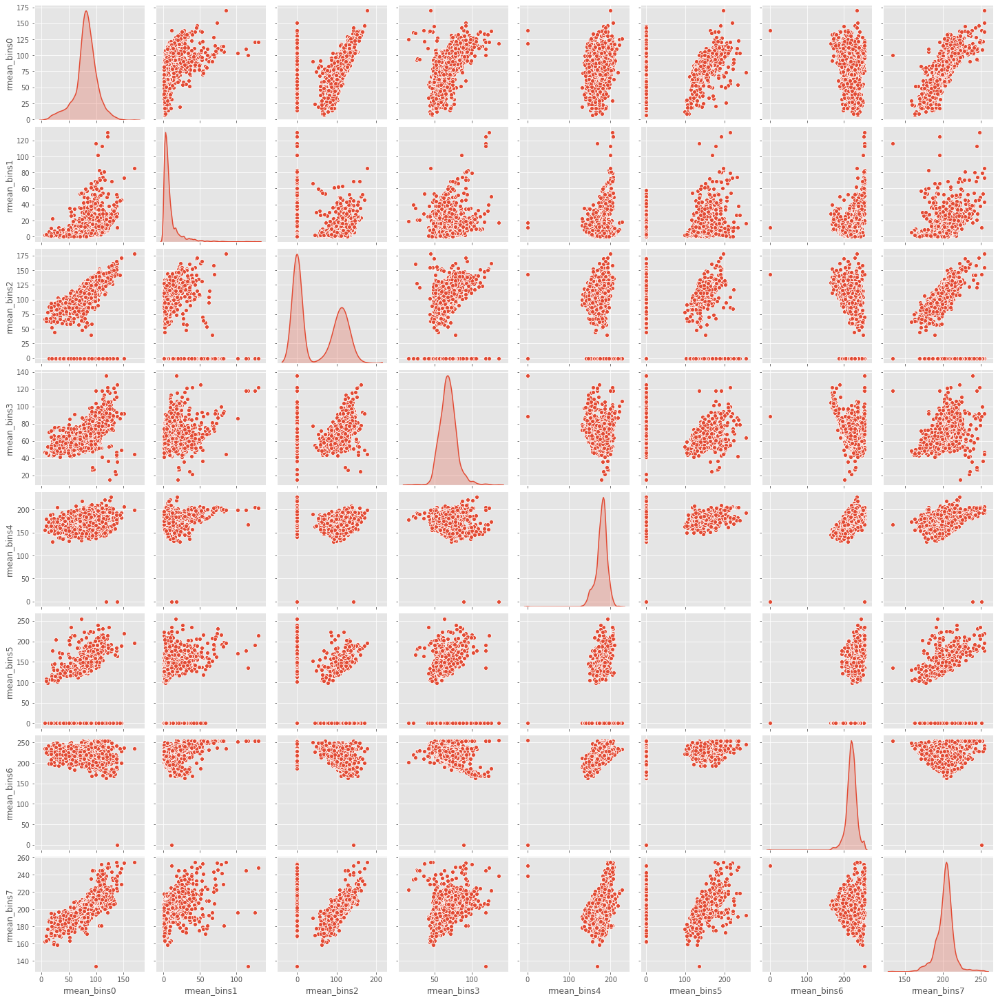

In [28]:
sns.pairplot(r.iloc[:, np.hstack(([0], range(1, 8)))], diag_kind='kde')

It can be noticed that rmean_bins0 has no definite correlation with other columns and there is high positive correlation among rmean_bins0 to rmean_bins7. Also notice how much the rmean_bins7 slope increases due to its high value.

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


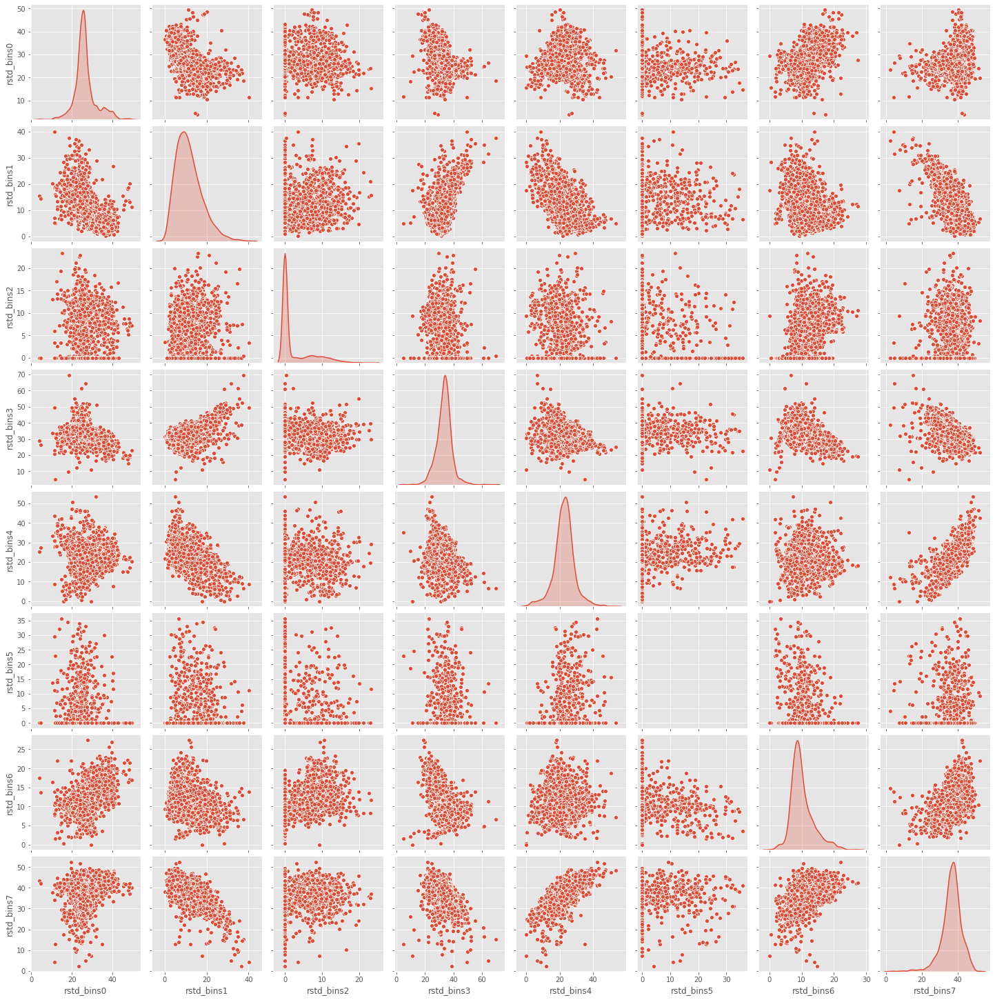

In [29]:
sns.pairplot(r.iloc[:, np.hstack((range(8, 16)))], diag_kind='kde')

Notice that rstd bin values do not have any correlation amongst each other and are simply scattered in all directions.

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


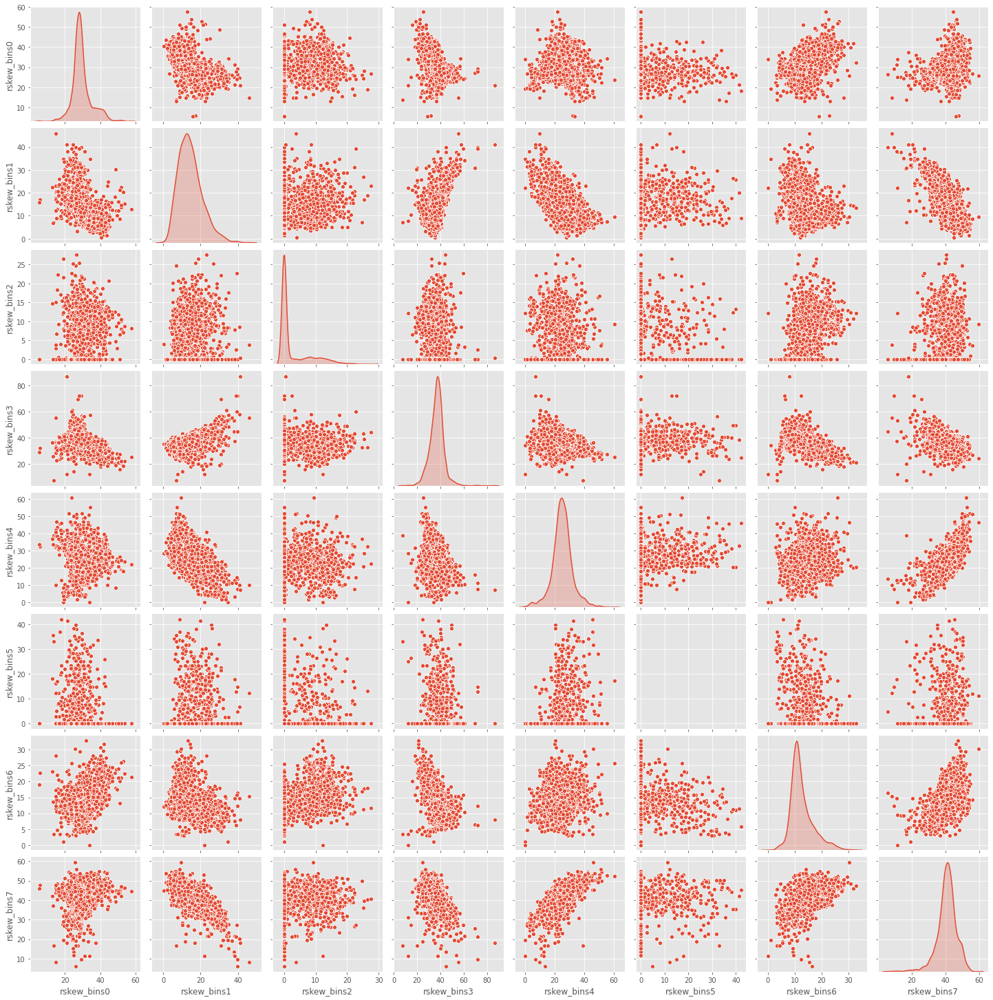

In [30]:
sns.pairplot(r.iloc[:, np.hstack((range(16, 24)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


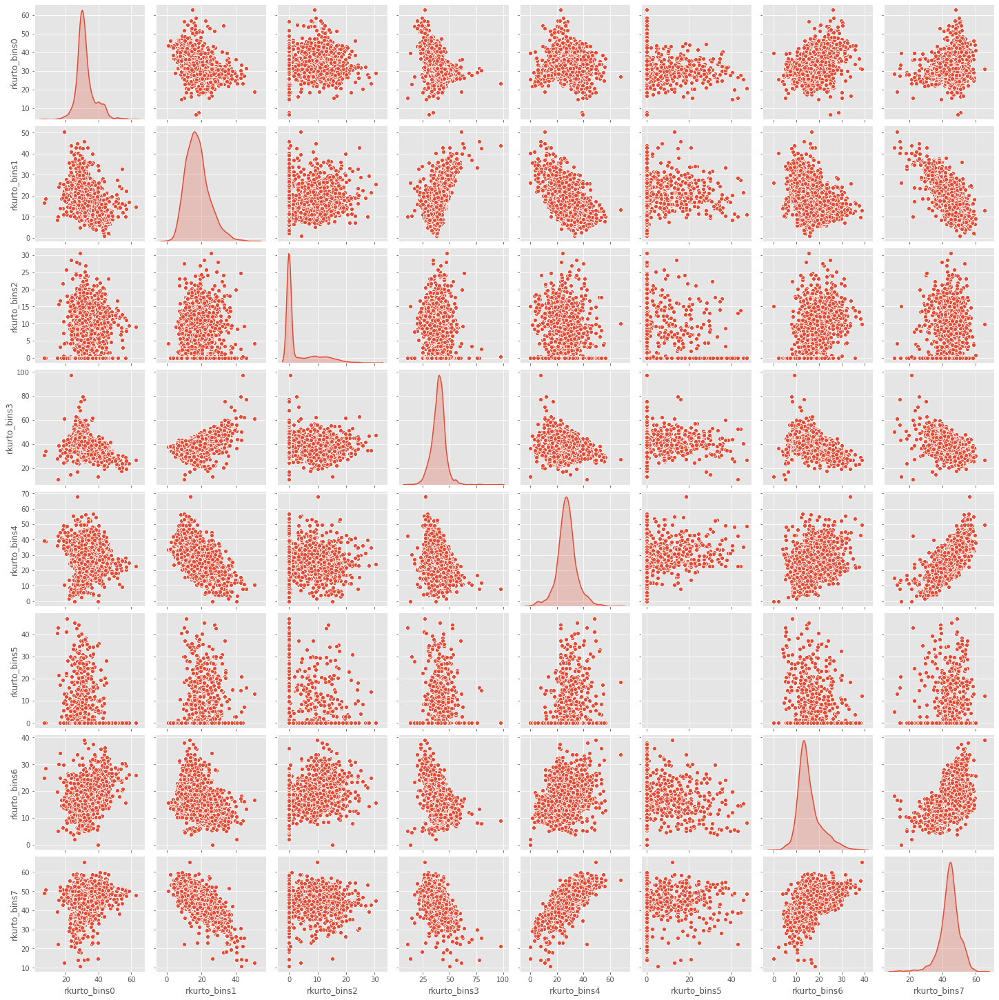

In [31]:
sns.pairplot(r.iloc[:, np.hstack((range(24, 32)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


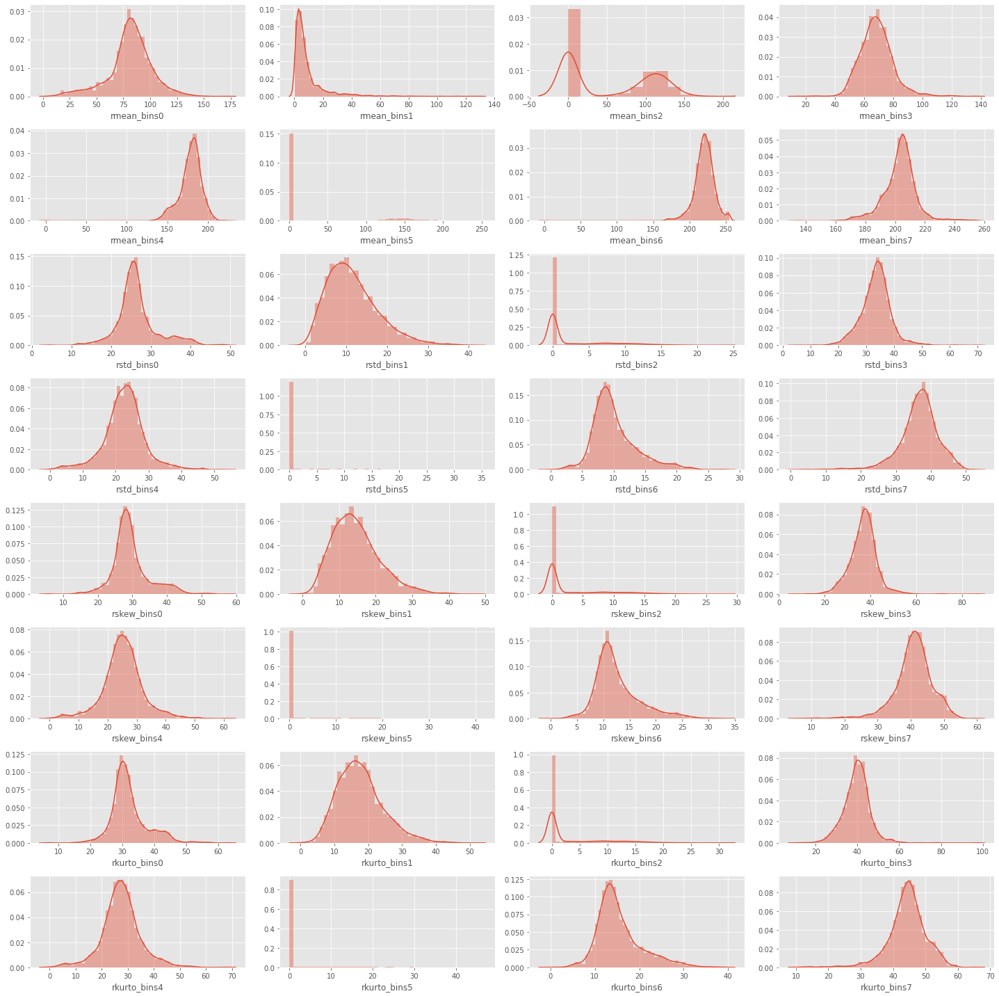

In [32]:
rows = 8
cols = 4

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize= (20, 20))
col = r.columns
index = 0

for i in range(rows):
    for j in range(cols):
        sns.distplot(r[col[index]], ax = ax[i][j])
        index += 1

plt.tight_layout()

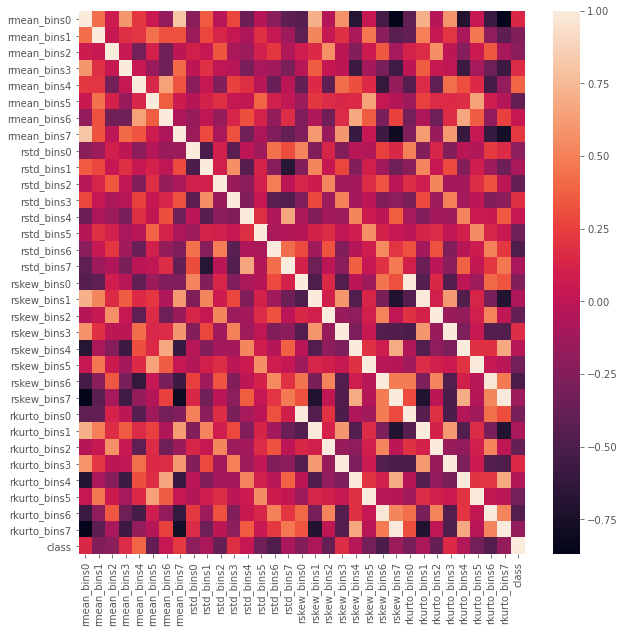

In [33]:
corrmat = r.corr()
fig, ax = plt.subplots(figsize = (10,10))
sns.heatmap(corrmat)

However, we know from the previous visualizations that std values have a high correlation with rskew and rkurto values, even if they don't have correlations high enough amongst themselves. So we wish to know the highest correlations by keeping threshold values > 0.5 with the class attribute. This will help us decide which attributes contribute largest to the prediction of our class.

In [34]:
def getCorrelatedFeatures(corrdata, threshold):
    feature = []
    value = []
    
    for i, index in enumerate(corrdata.index):
        if abs(corrdata[index]) > threshold:
            feature.append(index)
            value.append(corrdata[index])
            
    df = pd.DataFrame(data = value, index=feature, columns=['Correlation Values'])
    
    return df

In [35]:
corr_df = getCorrelatedFeatures(corrmat['class'], 0.5)

In [36]:
corr_df

,Correlation Values
class,1.0


In [37]:
corrmat = corrmat.abs().unstack() # absolute value of corr coef
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat[corrmat >= 0.5]
corrmat = corrmat[corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1', 'feature2', 'correlation values']
corrmat.head()
corrmat.tail()

,feature1,feature2,correlation values
155,rkurto_bins6,rstd_bins6,0.506510
156,rstd_bins0,rstd_bins1,0.505481
157,rstd_bins1,rstd_bins0,0.505481
158,rmean_bins1,rkurto_bins1,0.500593
159,rkurto_bins1,rmean_bins1,0.500593


In [38]:
# find groups of correlated features

grouped_feature_ls = []
correlated_groups = []

for feature in corrmat.feature1.unique():
    
    if feature not in grouped_feature_ls:

        # find all features correlated to a single feature
        correlated_block = corrmat[corrmat.feature1 == feature]
        grouped_feature_ls = grouped_feature_ls + list(
            correlated_block.feature2.unique()) + [feature]

        # append the block of features to the list
        correlated_groups.append(correlated_block)

print('found {} correlated groups'.format(len(correlated_groups)))

found 9 correlated groups


In [39]:
for group in correlated_groups:
    print(group)
    print()

        feature1      feature2  correlation values
0    rskew_bins5  rkurto_bins5            0.999076
58   rskew_bins5   rmean_bins5            0.650985
110  rskew_bins5    rstd_bins5            0.562765

        feature1      feature2  correlation values
2    rskew_bins2  rkurto_bins2            0.999014
105  rskew_bins2   rmean_bins2            0.564675
123  rskew_bins2    rstd_bins2            0.529283
145  rskew_bins2   rskew_bins6            0.515674
148  rskew_bins2  rkurto_bins6            0.512298

        feature1      feature2  correlation values
4   rkurto_bins3   rskew_bins3            0.995553
69  rkurto_bins3   rmean_bins7            0.611922
73  rkurto_bins3  rkurto_bins1            0.610918
75  rkurto_bins3   rskew_bins1            0.607430
92  rkurto_bins3   rmean_bins0            0.585034

         feature1      feature2  correlation values
6    rkurto_bins4   rskew_bins4            0.994199
38   rkurto_bins4   rskew_bins7            0.698062
40   rkurto_bins4   rmean

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]),
 <a list of 33 Text major ticklabel objects>)

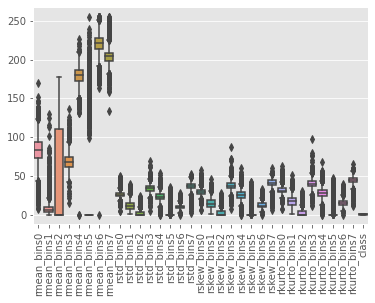

In [40]:
sns.boxplot(data=r)
plt.xticks(rotation=90)

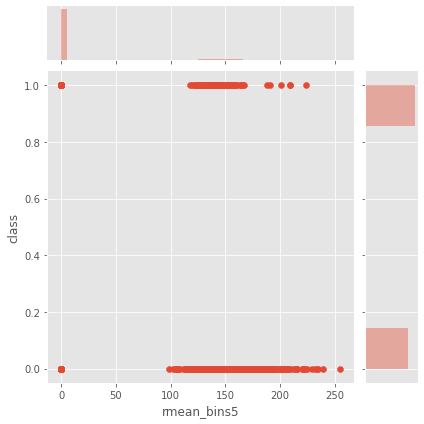

In [41]:
sns.jointplot(x = r['rmean_bins5'], y = r['class'])

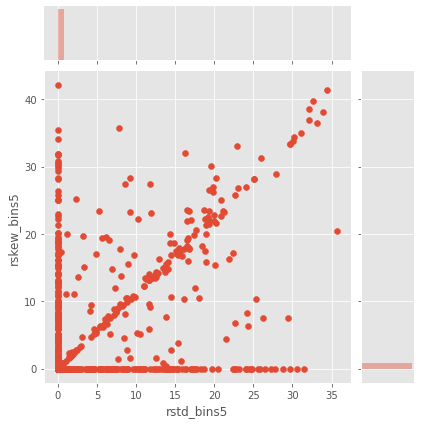

In [42]:
sns.jointplot(x = r['rstd_bins5'], y = r['rskew_bins5'])

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\nonparametric\kernels.py:125: RuntimeWarning: divide by zero encountered in true_divide
  return (1. / np.sqrt(2 * np.pi)) * np.exp(-(Xi - x)**2 / (h**2 * 2.))
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\nonparametric\kernels.py:125: RuntimeWarning: invalid value encountered in true_divide
  return (1. / np.sqrt(2 * np.pi)) * np.exp(-(Xi - x)**2 / (h**2 * 2.))
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\nonparametric\_kernel_base.py:514: RuntimeWarning: invalid value encountered in true_divide
  dens = Kval.prod(axis=1) / np.prod(bw[iscontinuous])
C:\Users\Admin\anaconda3\lib\site-packages\matplotlib\contour.py:1483: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
C:\Users\Admin\anaconda3\lib\site-packages\matplotlib\contour.py:1484: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
C:\Users\Admin\anaconda3\lib\site-packages\matplotlib

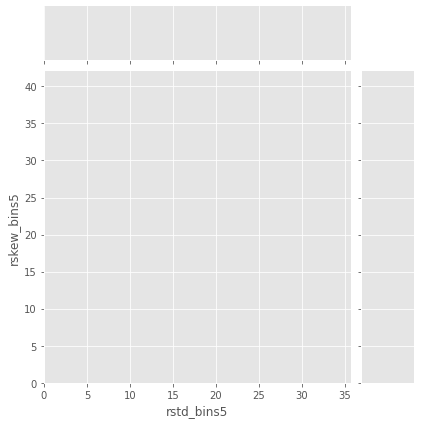

In [43]:
sns.jointplot(x = r['rstd_bins5'], y = r['rskew_bins5'], kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\nonparametric\kernels.py:125: RuntimeWarning: divide by zero encountered in true_divide
  return (1. / np.sqrt(2 * np.pi)) * np.exp(-(Xi - x)**2 / (h**2 * 2.))
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\nonparametric\kernels.py:125: RuntimeWarning: invalid value encountered in true_divide
  return (1. / np.sqrt(2 * np.pi)) * np.exp(-(Xi - x)**2 / (h**2 * 2.))
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\nonparametric\_kernel_base.py:514: RuntimeWarning: invalid value encountered in true_divide
  dens = Kval.prod(axis=1) / np.prod(bw[iscontinuous])
C:\Users\Admin\anaconda3\lib\site-packages\matplotlib\contour.py:1483: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
C:\Users\Admin\anaconda3\lib\site-packages\matplotlib\contour.py:1484: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
C:\Users\Admin\anaconda3\lib\site-packages\matplotlib

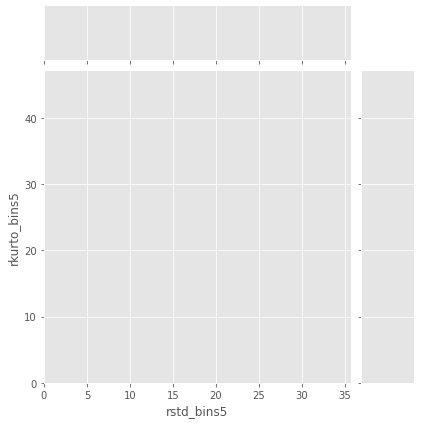

In [44]:
sns.jointplot(x = r['rstd_bins5'], y = r['rkurto_bins5'], kind='kde', color='m')

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\nonparametric\kernels.py:125: RuntimeWarning: divide by zero encountered in true_divide
  return (1. / np.sqrt(2 * np.pi)) * np.exp(-(Xi - x)**2 / (h**2 * 2.))
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\nonparametric\kernels.py:125: RuntimeWarning: invalid value encountered in true_divide
  return (1. / np.sqrt(2 * np.pi)) * np.exp(-(Xi - x)**2 / (h**2 * 2.))
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\nonparametric\_kernel_base.py:514: RuntimeWarning: invalid value encountered in true_divide
  dens = Kval.prod(axis=1) / np.prod(bw[iscontinuous])
C:\Users\Admin\anaconda3\lib\site-packages\matplotlib\contour.py:1483: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
C:\Users\Admin\anaconda3\lib\site-packages\matplotlib\contour.py:1484: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
C:\Users\Admin\anaconda3\lib\site-packages\matplotlib

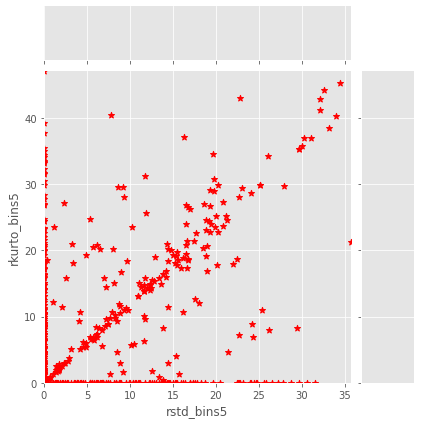

In [45]:
g = sns.jointplot(x = r['rstd_bins5'], y = r['rkurto_bins5'], kind='kde', color='m')
g.plot_joint(plt.scatter, c='r', s=40, linewidth=1, marker='*')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Defa

IndexError: index 8 is out of bounds for axis 0 with size 8

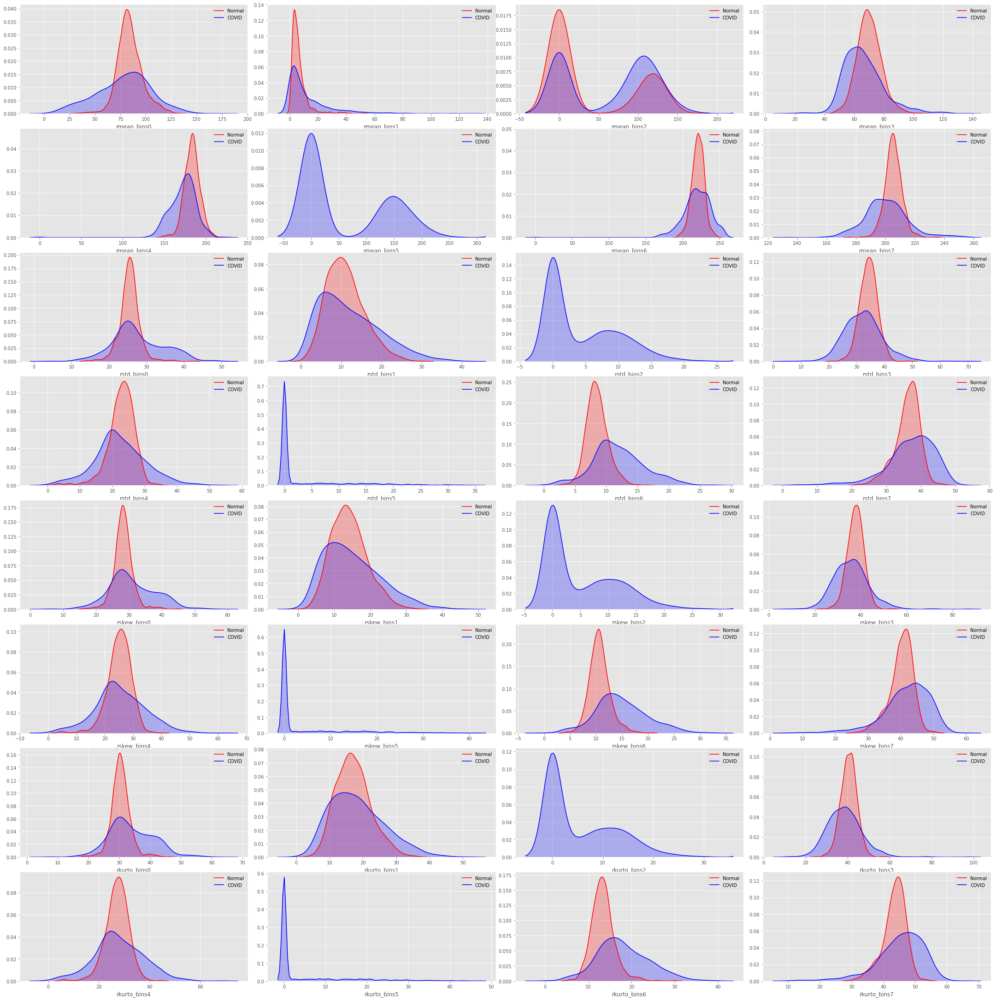

In [47]:
parasitized_df = r[r['class'] == 1]
uninfected_df = r[r['class'] == 0]

num_rows, num_cols = 5,2
rows = 8
cols = 4

fig, axes = plt.subplots(rows, cols, figsize=(30, 30))
fig.tight_layout()

for index, column in enumerate(r.columns):
    i,j = (index // cols, index % cols)
    g = sns.kdeplot(parasitized_df[column], color="Red", shade=True, ax=axes[i,j])
    g = sns.kdeplot(uninfected_df[column], ax=g, color="Blue", shade=True)
    g.set_xlabel(column)
    g = g.legend(["Normal","COVID"])

## Green Channel:

In [48]:
g = pd.read_csv('csv/image_bins_stats_lungs_g.csv')
g.head()

,filename,gmean_bins0,gmean_bins1,gmean_bins2,gmean_bins3,gmean_bins4,gmean_bins5,gmean_bins6,gmean_bins7,gstd_bins0,...,gskew_bins7,gkurto_bins0,gkurto_bins1,gkurto_bins2,gkurto_bins3,gkurto_bins4,gkurto_bins5,gkurto_bins6,gkurto_bins7,class
0,transformed_image_covid_1.png,0.559297,75.497206,151.50,173.671092,85.260012,35.000000,176.929828,238.883191,5.676991106,...,17.57257704,22.138606,40.643244,6.878650,21.949588,44.773898,0.000000,27.722930,19.447070,0
1,transformed_image_covid_2.png,1.284320,73.982556,153.60,168.233527,68.429056,0.000000,182.133812,243.227904,9.543929283,...,16.67048287,27.961239,47.511705,13.420244,25.457135,48.599111,0.000000,28.805436,19.927615,0
2,transformed_image_covid_3.png,1.354547,67.611642,155.00,176.068162,69.694692,9.000000,178.694667,244.802632,4.308858087,...,14.53875345,13.717988,42.412256,0.000000,30.223938,47.523806,7.568068,39.121198,17.238873,0
3,transformed_image_covid_4.png,0.096407,60.678758,164.50,184.059027,73.157966,1.444444,175.860951,247.473992,1.291344246,...,10.63615589,6.293662,46.376956,0.420448,34.983342,43.431048,4.107089,33.763894,12.439575,0
4,transformed_image_covid_5.png,2.906584,80.865810,143.75,181.463296,79.882008,31.111111,185.061510,244.630234,12.00042989,...,13.71483543,29.101699,42.762183,6.535385,30.097276,56.385295,20.760033,34.503158,15.682609,0


In [49]:
g = g.drop(['filename'], axis=1)

In [50]:
g.describe()

,gmean_bins0,gmean_bins1,gmean_bins2,gmean_bins3,gmean_bins4,gmean_bins5,gmean_bins6,gmean_bins7,gkurto_bins0,gkurto_bins1,gkurto_bins2,gkurto_bins3,gkurto_bins4,gkurto_bins5,gkurto_bins6,gkurto_bins7
count,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000
mean,3.959494,72.823513,69.186772,181.078279,77.976813,13.643692,179.983204,242.347849,22.332808,43.832642,2.101479,26.745750,45.477587,2.515478,30.937692,17.567011
std,7.643138,14.763020,74.729362,8.120694,12.625961,34.464907,9.041615,5.332220,8.219645,5.558842,3.613622,6.223858,7.519813,8.694887,4.956352,4.423216
min,0.004344,5.070983,0.000000,146.681733,0.000000,0.000000,0.000000,147.968194,0.940124,15.158015,0.000000,3.479198,0.000000,0.000000,0.000000,0.000000
25%,0.311865,64.166417,0.000000,175.322539,70.237133,0.000000,175.707476,240.774793,17.326802,41.665642,0.000000,22.890744,42.936615,0.000000,28.013416,15.181014
50%,0.804030,72.252050,0.000000,180.215200,78.078971,0.000000,180.044573,242.749808,21.059995,44.848210,0.000000,25.399840,46.472647,0.000000,30.503152,16.771785
75%,3.826278,80.548648,148.827083,186.055613,85.309182,0.000000,184.016362,244.576001,25.943305,47.097126,3.686750,29.411188,49.507023,0.000000,33.261694,19.281836
max,66.158963,130.046922,175.000000,238.350182,131.013251,143.000000,212.143595,255.000000,62.035550,70.935168,19.062410,61.174638,71.763497,66.437542,60.076748,66.949222


In [51]:
g.describe().loc['mean']

gmean_bins0       3.959494
gmean_bins1      72.823513
gmean_bins2      69.186772
gmean_bins3     181.078279
gmean_bins4      77.976813
gmean_bins5      13.643692
gmean_bins6     179.983204
gmean_bins7     242.347849
gkurto_bins0     22.332808
gkurto_bins1     43.832642
gkurto_bins2      2.101479
gkurto_bins3     26.745750
gkurto_bins4     45.477587
gkurto_bins5      2.515478
gkurto_bins6     30.937692
gkurto_bins7     17.567011
Name: mean, dtype: float64

There is very high variance from column to columns which is not desired. Notice how variance from gmean_bins0 to 7 differs by high amount of values. gstd, gskew and gkurto are almost stable except there is a noticeable change from gskew_bins6 to 7.

In [52]:
g.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2484 entries, 0 to 2483
Data columns (total 33 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   gmean_bins0   2484 non-null   float64
 1   gmean_bins1   2484 non-null   float64
 2   gmean_bins2   2484 non-null   float64
 3   gmean_bins3   2484 non-null   float64
 4   gmean_bins4   2484 non-null   float64
 5   gmean_bins5   2484 non-null   float64
 6   gmean_bins6   2484 non-null   float64
 7   gmean_bins7   2484 non-null   float64
 8   gstd_bins0    2484 non-null   object 
 9   gstd_bins1    2484 non-null   object 
 10  gstd_bins2    2484 non-null   object 
 11  gstd_bins3    2484 non-null   object 
 12  gstd_bins4    2484 non-null   object 
 13  gstd_bins5    2484 non-null   object 
 14  gstd_bins6    2484 non-null   object 
 15  gstd_bins7    2484 non-null   object 
 16  gskew_bins0   2484 non-null   object 
 17  gskew_bins1   2484 non-null   object 
 18  gskew_bins2   2484 non-null 

In [53]:
g.isnull().sum()

gmean_bins0     0
gmean_bins1     0
gmean_bins2     0
gmean_bins3     0
gmean_bins4     0
gmean_bins5     0
gmean_bins6     0
gmean_bins7     0
gstd_bins0      0
gstd_bins1      0
gstd_bins2      0
gstd_bins3      0
gstd_bins4      0
gstd_bins5      0
gstd_bins6      0
gstd_bins7      0
gskew_bins0     0
gskew_bins1     0
gskew_bins2     0
gskew_bins3     0
gskew_bins4     0
gskew_bins5     0
gskew_bins6     0
gskew_bins7     0
gkurto_bins0    0
gkurto_bins1    0
gkurto_bins2    0
gkurto_bins3    0
gkurto_bins4    0
gkurto_bins5    0
gkurto_bins6    0
gkurto_bins7    0
class           0
dtype: int64

In [54]:
g.duplicated().sum()

0

In [55]:
name = ['gstd_bins0','gstd_bins1','gstd_bins2','gstd_bins3','gstd_bins4','gstd_bins5','gstd_bins6','gstd_bins7']
for i in name:
    g[i] = pd.to_numeric(data[i],errors='coerce')

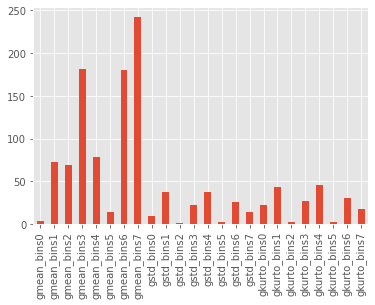

In [56]:
g.describe().loc['mean'].plot.bar()

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


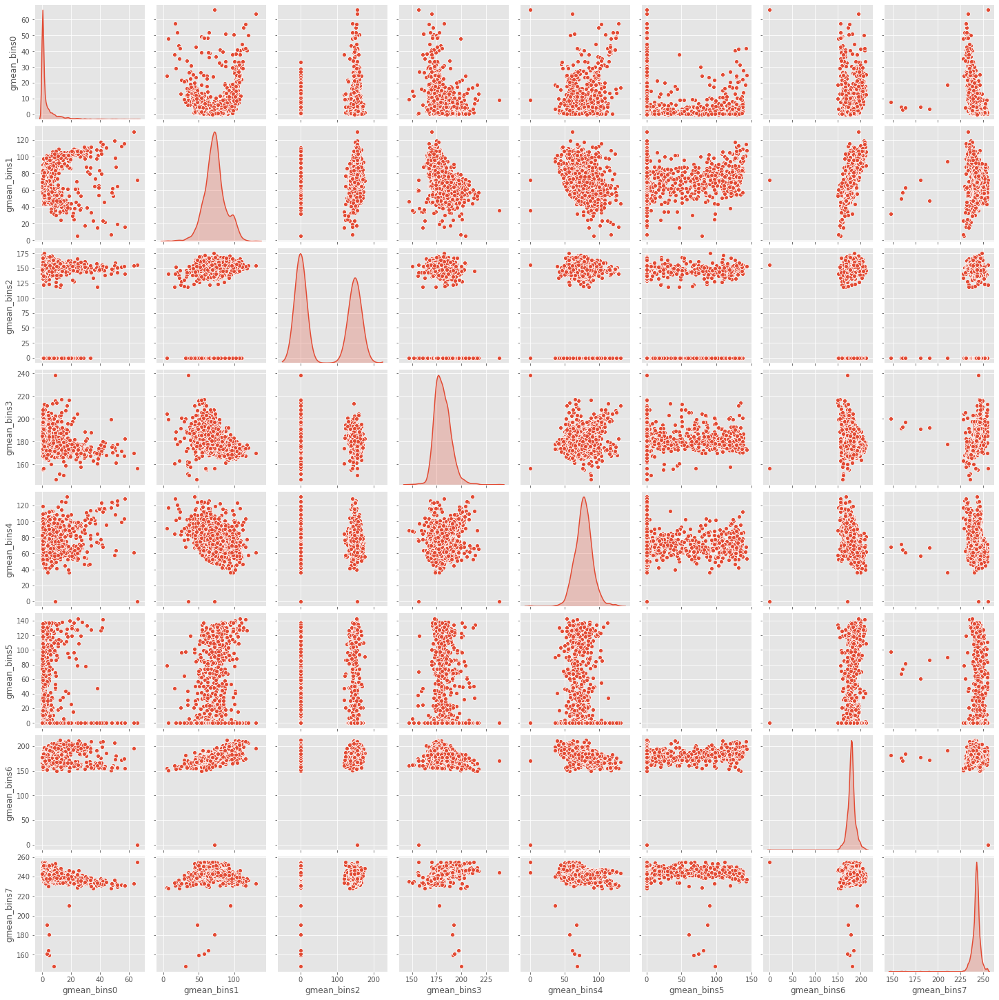

In [57]:
sns.pairplot(g.iloc[:, np.hstack(([0], range(1, 8)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


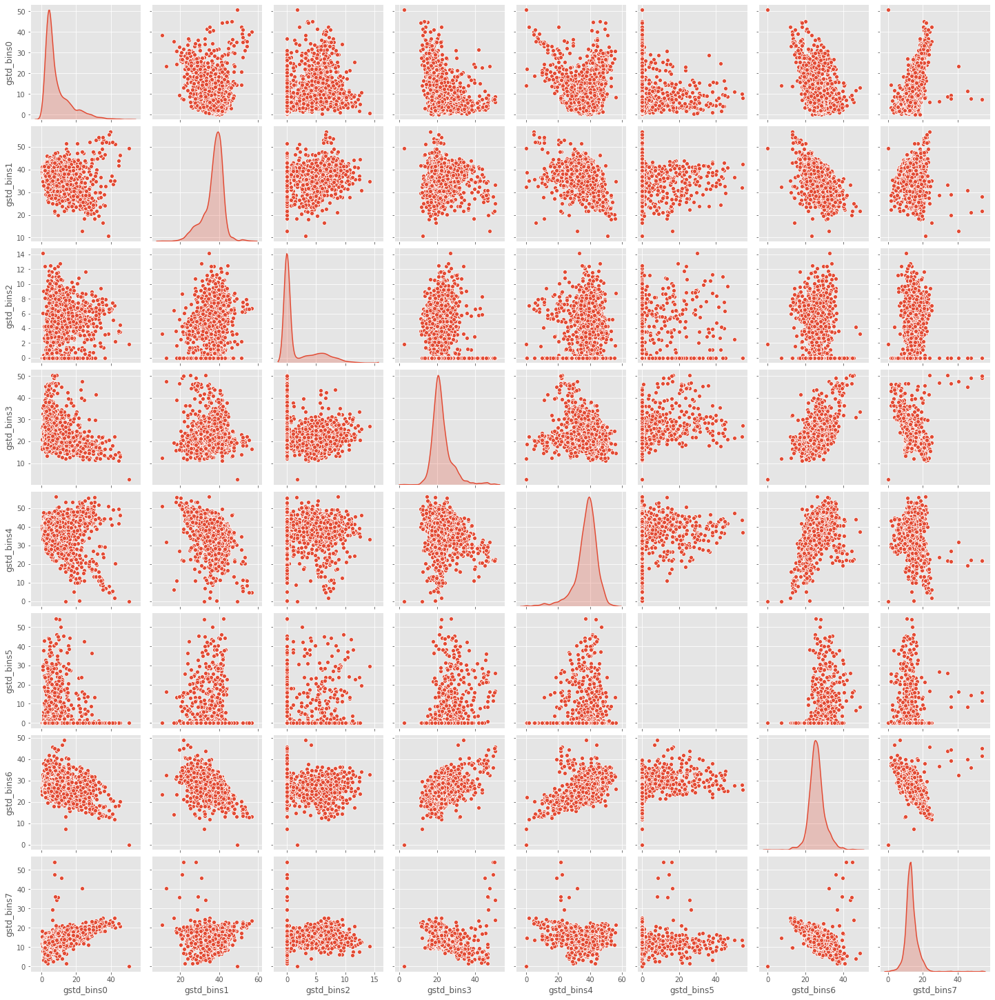

In [58]:
sns.pairplot(g.iloc[:, np.hstack((range(8, 16)))], diag_kind='kde')

In [62]:
name = ['gskew_bins0','gskew_bins1','gskew_bins2','gskew_bins3','gskew_bins4','gskew_bins5','gskew_bins6','gskew_bins7']
for i in name:
    g[i] = pd.to_numeric(data[i],errors='coerce')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


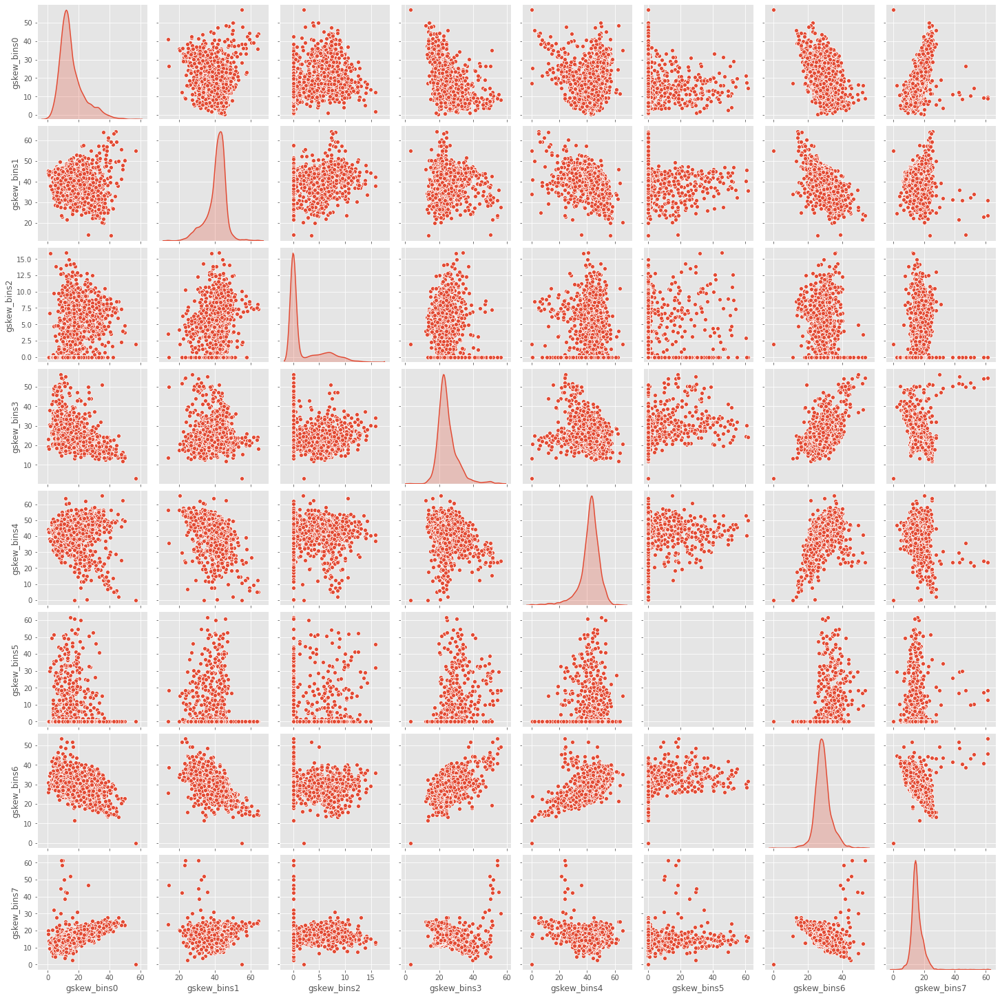

In [63]:
sns.pairplot(g.iloc[:, np.hstack((range(16, 24)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


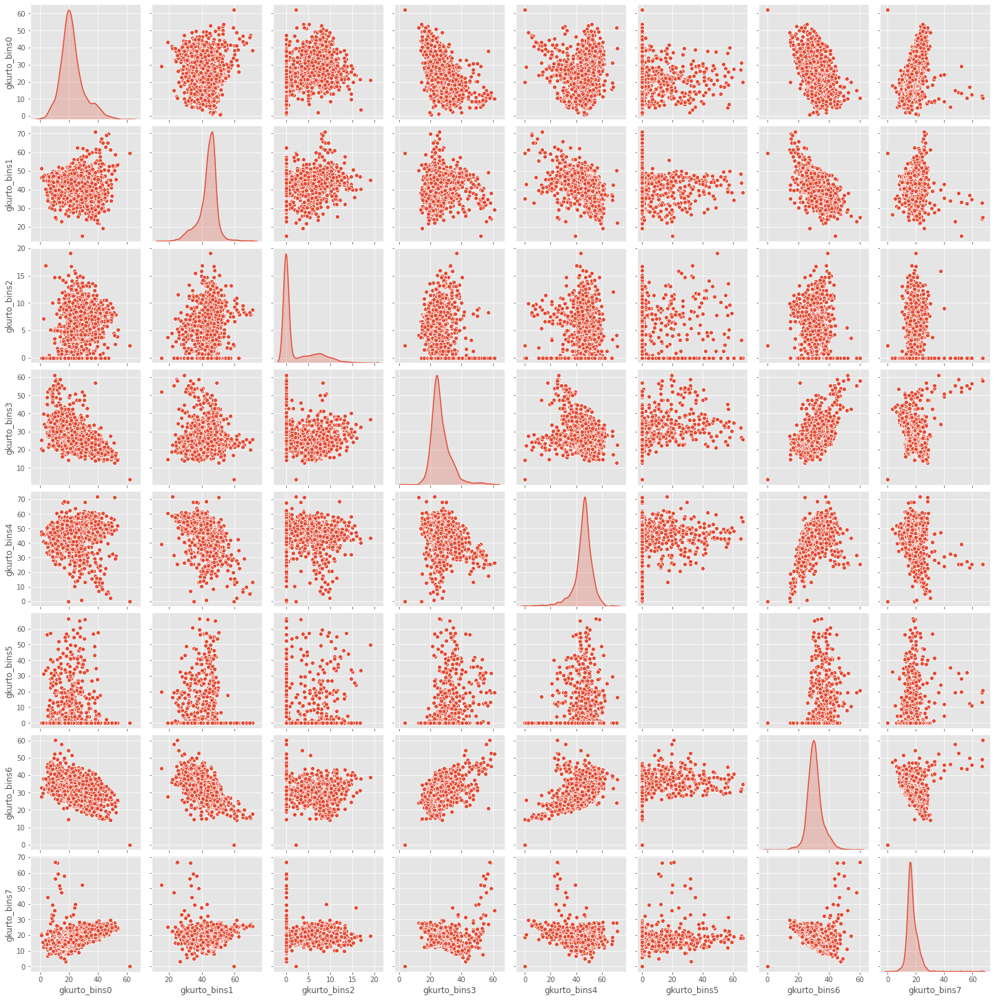

In [64]:
sns.pairplot(g.iloc[:, np.hstack((range(24, 32)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


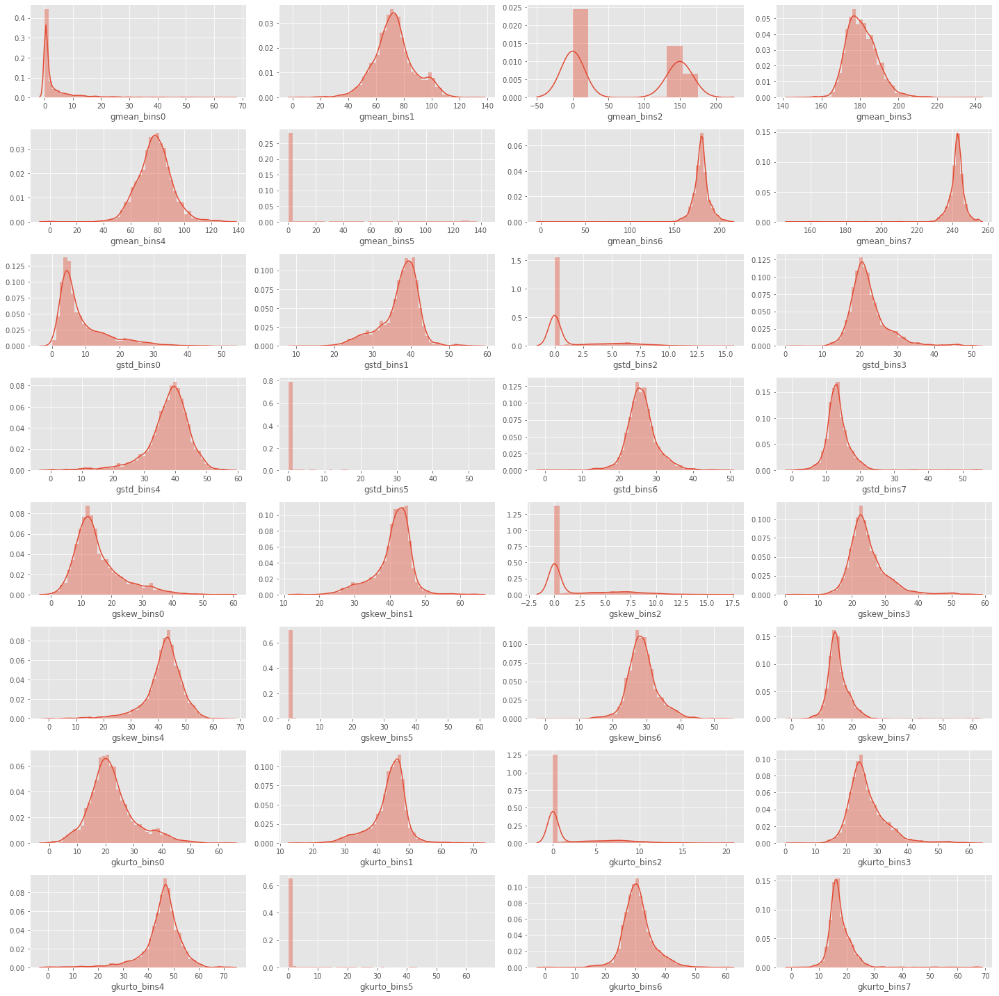

In [65]:
rows = 8
cols = 4

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize= (20, 20))
col = g.columns
index = 0

for i in range(rows):
    for j in range(cols):
        sns.distplot(g[col[index]], ax = ax[i][j])
        index += 1

plt.tight_layout()

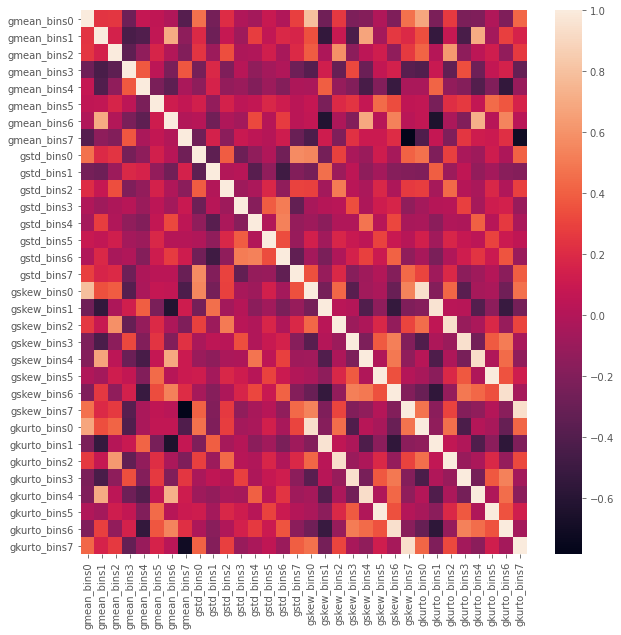

In [66]:
corrmat = g.corr()
fig, ax = plt.subplots(figsize = (10,10))
sns.heatmap(corrmat)

In [69]:
corrmat = corrmat.abs().unstack() # absolute value of corr coef
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat[corrmat >= 0.5]
corrmat = corrmat[corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1', 'feature2', 'correlation values']
corrmat.head()

,feature1,feature2,correlation values
0,gskew_bins5,gkurto_bins5,0.997824
1,gkurto_bins5,gskew_bins5,0.997824
2,gskew_bins1,gkurto_bins1,0.959783
3,gkurto_bins1,gskew_bins1,0.959783
4,gkurto_bins6,gskew_bins6,0.946643


In [70]:
# find groups of correlated features

grouped_feature_ls = []
correlated_groups = []

for feature in corrmat.feature1.unique():
    
    if feature not in grouped_feature_ls:

        # find all features correlated to a single feature
        correlated_block = corrmat[corrmat.feature1 == feature]
        grouped_feature_ls = grouped_feature_ls + list(
            correlated_block.feature2.unique()) + [feature]

        # append the block of features to the list
        correlated_groups.append(correlated_block)

print('found {} correlated groups'.format(len(correlated_groups)))

found 10 correlated groups


In [71]:
for group in correlated_groups:
    print(group)
    print()

      feature1      feature2  correlation values
0  gskew_bins5  gkurto_bins5            0.997824

       feature1      feature2  correlation values
2   gskew_bins1  gkurto_bins1            0.959783
38  gskew_bins1   gmean_bins6            0.621043
50  gskew_bins1   gmean_bins1            0.546452
58  gskew_bins1   gskew_bins6            0.534154
70  gskew_bins1  gkurto_bins6            0.515830

       feature1      feature2  correlation values
6   gskew_bins3  gkurto_bins3            0.944812
68  gskew_bins3   gskew_bins6            0.525755
76  gskew_bins3  gkurto_bins6            0.508411

        feature1     feature2  correlation values
8   gkurto_bins7  gskew_bins7            0.943828
26  gkurto_bins7  gmean_bins7            0.702262

       feature1      feature2  correlation values
10  gskew_bins2  gkurto_bins2            0.939551
41  gskew_bins2   gmean_bins2            0.591958
78  gskew_bins2    gstd_bins2            0.500100

       feature1      feature2  correlation valu

In [78]:
parasitized_df = g[g['class'] == 1]
uninfected_df = g[g['class'] == 0]

num_rows, num_cols = 5,2
rows = 8
cols = 4

fig, axes = plt.subplots(rows, cols, figsize=(30, 30))
fig.tight_layout()

for index, column in enumerate(g.columns):
    i,j = (index // cols, index % cols)
    g = sns.kdeplot(parasitized_df[column], color="Red", shade=True, ax=axes[i,j])
    g = sns.kdeplot(uninfected_df[column], ax=g, color="Blue", shade=True)
    g.set_xlabel(column)
    g = g.legend(["Normal","COVID"])

TypeError: 'Legend' object is not subscriptable

## Blue Channel:

In [80]:
b = pd.read_csv('csv/image_bins_stats_lungs_b.csv')
b.head()

,filename,bmean_bins0,bmean_bins1,bmean_bins2,bmean_bins3,bmean_bins4,bmean_bins5,bmean_bins6,bmean_bins7,bstd_bins0,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
0,transformed_image_covid_1.png,74.206692,169.860153,103.00,195.180268,2.166321,194.000000,62.217396,181.939041,33.82166078,...,29.26670025,39.092067,21.915792,15.564234,10.232452,12.530200,0.000000,40.674295,31.538221,0
1,transformed_image_covid_2.png,91.794997,167.562952,116.44,192.314484,9.734026,0.000000,63.289995,192.868262,23.118773,...,33.53821958,28.281468,23.127681,11.979449,17.519198,24.313131,0.000000,38.506228,36.562100,0
2,transformed_image_covid_3.png,120.381754,184.116581,146.00,221.884977,41.313315,163.000000,55.737395,200.551265,21.70673851,...,25.22521593,26.681675,24.442798,0.000000,12.323460,38.083555,4.204482,55.658016,27.952446,0
3,transformed_image_covid_4.png,86.913234,172.692593,121.00,227.222190,23.076839,151.000000,46.736233,190.758808,18.91096944,...,34.51618537,24.056261,28.558353,0.840896,13.800903,27.757483,33.449086,44.809595,37.884099,0
4,transformed_image_covid_5.png,102.684319,177.985451,127.50,219.588457,13.720265,179.444444,60.626680,205.781096,23.00131742,...,32.13721328,27.884767,23.329477,13.445587,16.742312,28.738945,26.135224,49.330295,35.162254,0


In [81]:
b.describe()

,bmean_bins0,bmean_bins1,bmean_bins2,bmean_bins3,bmean_bins4,bmean_bins5,bmean_bins6,bmean_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7
count,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000,2484.000000
mean,84.568451,166.846653,51.214035,208.770051,12.499566,33.939682,60.241826,193.617905,31.379560,22.126366,3.205326,12.486809,18.863197,1.735519,43.381415,33.116615
std,22.603668,13.722095,57.306276,18.463266,19.580362,65.768720,13.802332,12.343823,6.963029,4.693316,5.645399,3.675152,7.826634,5.555110,7.192143,5.533921
min,4.485645,93.019761,0.000000,128.413953,0.000000,0.000000,0.000000,115.215690,7.435075,6.374928,0.000000,3.431584,0.000000,0.000000,0.000000,7.434697
25%,74.196579,158.152269,0.000000,199.389938,1.990720,0.000000,53.132254,187.351917,26.900223,19.865883,0.000000,10.156932,12.915442,0.000000,39.925443,29.654272
50%,87.610389,167.628016,0.000000,210.295650,5.346950,0.000000,58.647048,193.173472,30.195675,22.286236,0.000000,11.608803,18.498622,0.000000,43.672041,32.620101
75%,97.840532,174.780915,108.083333,220.514014,12.954619,0.000000,66.072674,199.257100,35.000146,24.543958,4.624930,13.917473,24.372837,0.000000,47.135403,35.962306
max,146.552478,225.940309,181.500000,253.865331,153.173939,248.000000,162.284434,254.840832,64.348561,47.254294,30.957677,40.018307,58.796364,46.669751,65.854665,63.115967


In [82]:
b = b.drop(['filename'], axis=1)

In [83]:
b.describe().loc['mean']

bmean_bins0      84.568451
bmean_bins1     166.846653
bmean_bins2      51.214035
bmean_bins3     208.770051
bmean_bins4      12.499566
bmean_bins5      33.939682
bmean_bins6      60.241826
bmean_bins7     193.617905
bkurto_bins0     31.379560
bkurto_bins1     22.126366
bkurto_bins2      3.205326
bkurto_bins3     12.486809
bkurto_bins4     18.863197
bkurto_bins5      1.735519
bkurto_bins6     43.381415
bkurto_bins7     33.116615
Name: mean, dtype: float64

In [84]:
b.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2484 entries, 0 to 2483
Data columns (total 33 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   bmean_bins0   2484 non-null   float64
 1   bmean_bins1   2484 non-null   float64
 2   bmean_bins2   2484 non-null   float64
 3   bmean_bins3   2484 non-null   float64
 4   bmean_bins4   2484 non-null   float64
 5   bmean_bins5   2484 non-null   float64
 6   bmean_bins6   2484 non-null   float64
 7   bmean_bins7   2484 non-null   float64
 8   bstd_bins0    2484 non-null   object 
 9   bstd_bins1    2484 non-null   object 
 10  bstd_bins2    2484 non-null   object 
 11  bstd_bins3    2484 non-null   object 
 12  bstd_bins4    2484 non-null   object 
 13  bstd_bins5    2484 non-null   object 
 14  bstd_bins6    2484 non-null   object 
 15  bstd_bins7    2484 non-null   object 
 16  bskew_bins0   2484 non-null   object 
 17  bskew_bins1   2484 non-null   object 
 18  bskew_bins2   2484 non-null 

In [85]:
b.isnull().sum()

bmean_bins0     0
bmean_bins1     0
bmean_bins2     0
bmean_bins3     0
bmean_bins4     0
bmean_bins5     0
bmean_bins6     0
bmean_bins7     0
bstd_bins0      0
bstd_bins1      0
bstd_bins2      0
bstd_bins3      0
bstd_bins4      0
bstd_bins5      0
bstd_bins6      0
bstd_bins7      0
bskew_bins0     0
bskew_bins1     0
bskew_bins2     0
bskew_bins3     0
bskew_bins4     0
bskew_bins5     0
bskew_bins6     0
bskew_bins7     0
bkurto_bins0    0
bkurto_bins1    0
bkurto_bins2    0
bkurto_bins3    0
bkurto_bins4    0
bkurto_bins5    0
bkurto_bins6    0
bkurto_bins7    0
class           0
dtype: int64

In [86]:
b = b.drop(['filename'], axis=1)
b.head()

KeyError: "['filename'] not found in axis"

In [87]:
import numpy as np
def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    return df[indices_to_keep].astype(np.float64)

clean_dataset(data)

,Bins0,Bins1,Bins2,Bins3,Bins4,Bins5,Bins6,Bins7,rmean_bins0,rmean_bins1,...,bskew_bins7,bkurto_bins0,bkurto_bins1,bkurto_bins2,bkurto_bins3,bkurto_bins4,bkurto_bins5,bkurto_bins6,bkurto_bins7,class
0,4722.0,15567.0,4.0,7683.0,12061.0,1.0,8864.0,16634.0,77.433079,0.202929,...,29.266700,39.092067,21.915792,15.564234,10.232452,12.530200,0.000000,40.674295,31.538221,0.0
1,6556.0,13701.0,25.0,9956.0,9437.0,0.0,12114.0,13747.0,79.728951,5.447851,...,33.538220,28.281468,23.127681,11.979449,17.519198,24.313131,0.000000,38.506228,36.562100,0.0
2,10512.0,12249.0,1.0,11502.0,7743.0,2.0,9619.0,13908.0,68.987348,36.388358,...,25.225216,26.681675,24.442798,0.000000,12.323460,38.083555,4.204482,55.658016,27.952446,0.0
3,7987.0,11854.0,2.0,10419.0,11895.0,9.0,11931.0,11439.0,94.638788,15.529948,...,34.516185,24.056261,28.558353,0.840896,13.800903,27.757483,33.449086,44.809595,37.884099,0.0
4,7761.0,14159.0,4.0,10898.0,10560.0,9.0,9153.0,12992.0,68.762015,4.809379,...,32.137213,27.884767,23.329477,13.445587,16.742312,28.738945,26.135224,49.330295,35.162254,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2479,4950.0,16941.0,0.0,9161.0,12953.0,0.0,8179.0,13352.0,59.237576,0.162269,...,25.786782,40.580961,22.391613,0.000000,6.716628,15.733760,0.000000,45.642531,33.442984,1.0
2480,6149.0,11217.0,1.0,10795.0,14813.0,0.0,7335.0,15226.0,89.067328,2.286262,...,30.321740,38.459722,19.856163,0.000000,7.773049,11.227728,0.000000,40.091211,34.380787,1.0
2481,8157.0,8955.0,3.0,8384.0,14395.0,0.0,8516.0,17126.0,110.959421,12.390955,...,30.361398,40.138990,24.611149,8.738112,13.053664,9.750293,0.000000,32.766410,38.228325,1.0
2482,6614.0,11508.0,3.0,10639.0,14738.0,0.0,7195.0,14839.0,90.745086,4.628172,...,35.209322,29.755901,22.888434,14.582557,13.300365,13.399057,0.000000,41.964578,34.453684,1.0


In [88]:
b.isnull().sum()

bmean_bins0     0
bmean_bins1     0
bmean_bins2     0
bmean_bins3     0
bmean_bins4     0
bmean_bins5     0
bmean_bins6     0
bmean_bins7     0
bstd_bins0      0
bstd_bins1      0
bstd_bins2      0
bstd_bins3      0
bstd_bins4      0
bstd_bins5      0
bstd_bins6      0
bstd_bins7      0
bskew_bins0     0
bskew_bins1     0
bskew_bins2     0
bskew_bins3     0
bskew_bins4     0
bskew_bins5     0
bskew_bins6     0
bskew_bins7     0
bkurto_bins0    0
bkurto_bins1    0
bkurto_bins2    0
bkurto_bins3    0
bkurto_bins4    0
bkurto_bins5    0
bkurto_bins6    0
bkurto_bins7    0
class           0
dtype: int64

In [89]:
b.duplicated().sum()

0

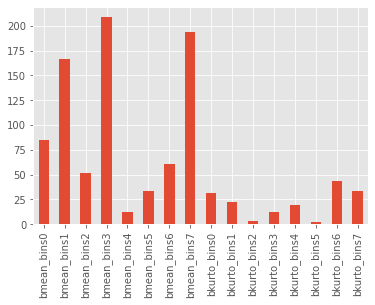

In [90]:
b.describe().loc['mean'].plot.bar()

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


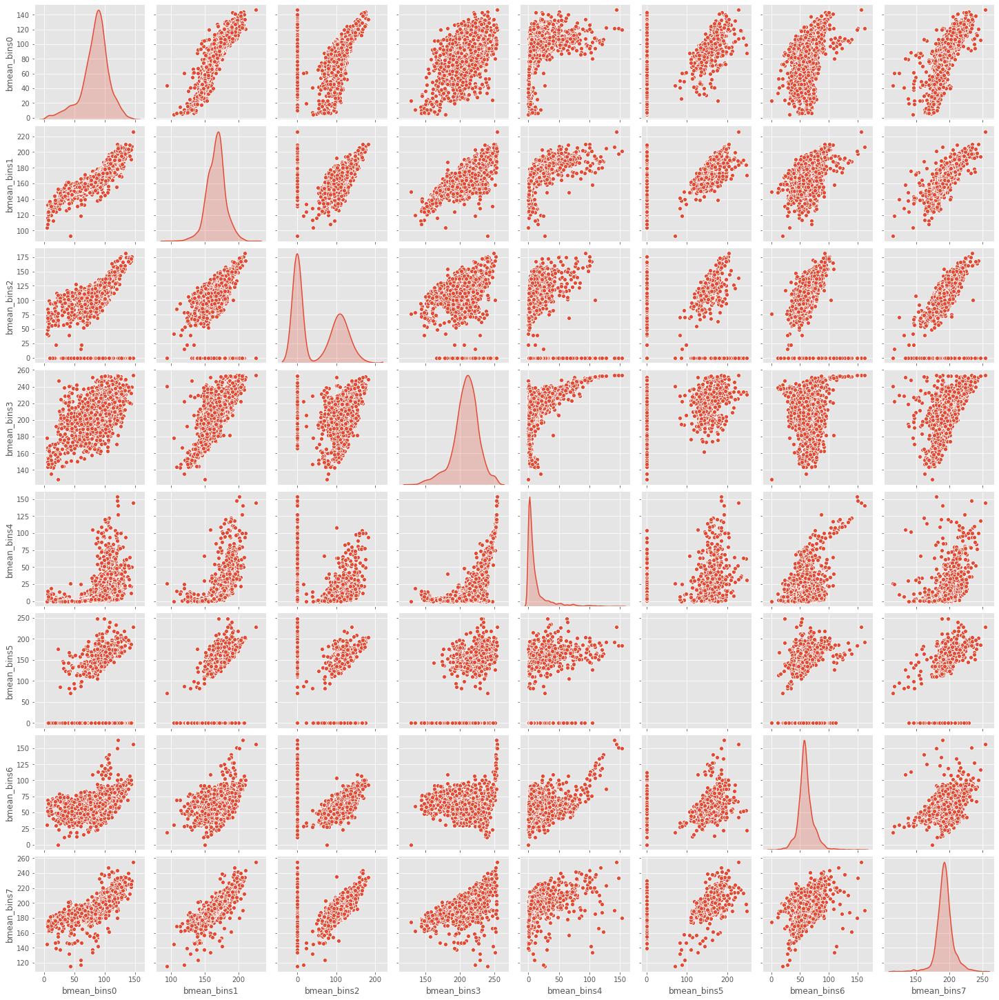

In [91]:
sns.pairplot(b.iloc[:, np.hstack(([0], range(1, 8)))], diag_kind='kde')

In [94]:
name = ['bstd_bins0','bstd_bins1','bstd_bins2','bstd_bins3','bstd_bins4','bstd_bins5','bstd_bins6','bstd_bins7']
for i in name:
    b[i] = pd.to_numeric(b[i],errors='coerce')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


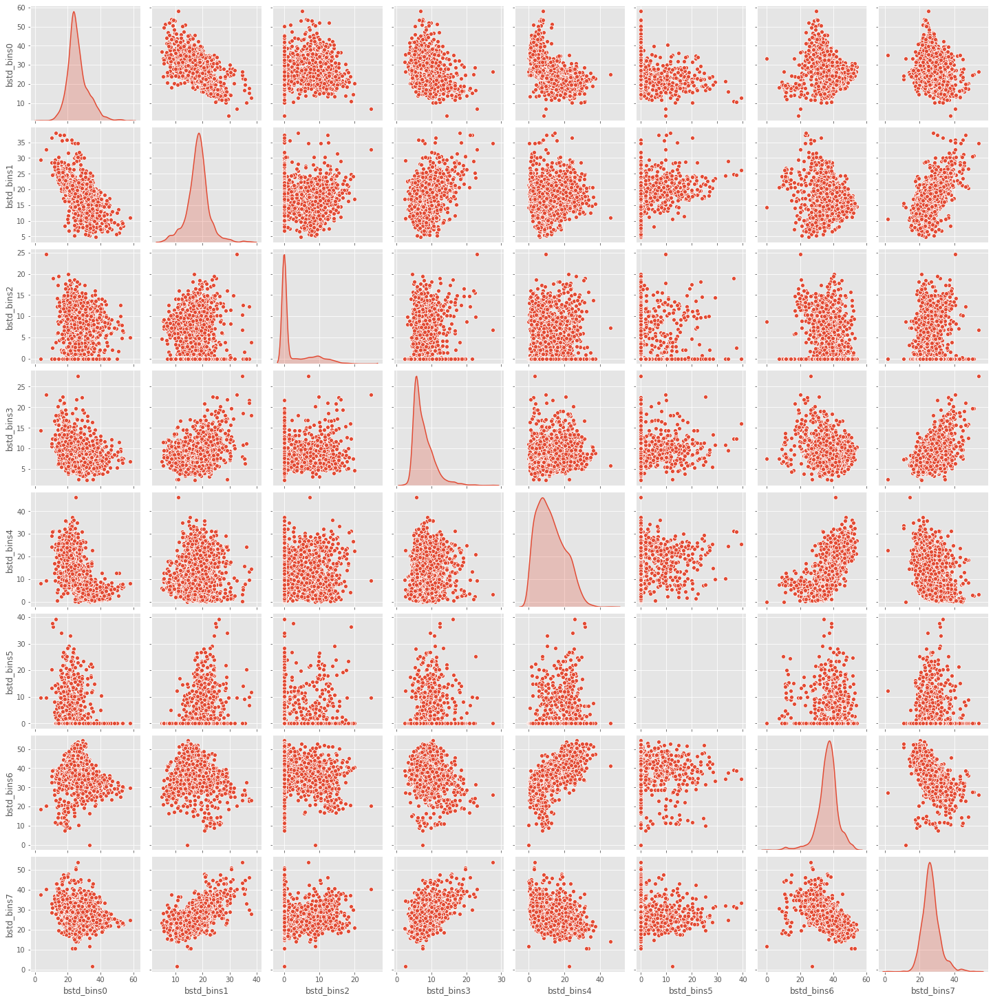

In [95]:
sns.pairplot(b.iloc[:, np.hstack((range(8, 16)))], diag_kind='kde')

In [97]:
name = ['bskew_bins0','bskew_bins1','bskew_bins2','bskew_bins3','bskew_bins4','bskew_bins5','bskew_bins6','bskew_bins7']
for i in name:
    b[i] = pd.to_numeric(b[i],errors='coerce')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


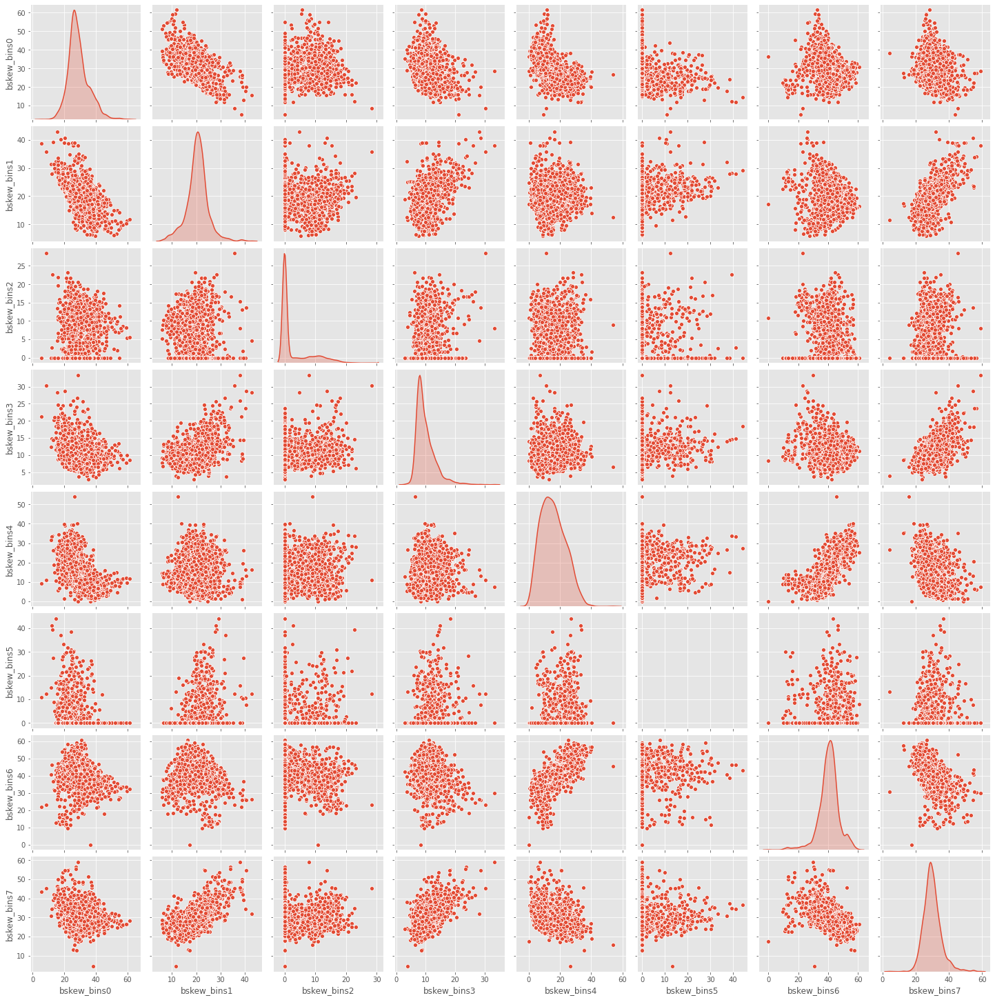

In [98]:
sns.pairplot(b.iloc[:, np.hstack((range(16, 24)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


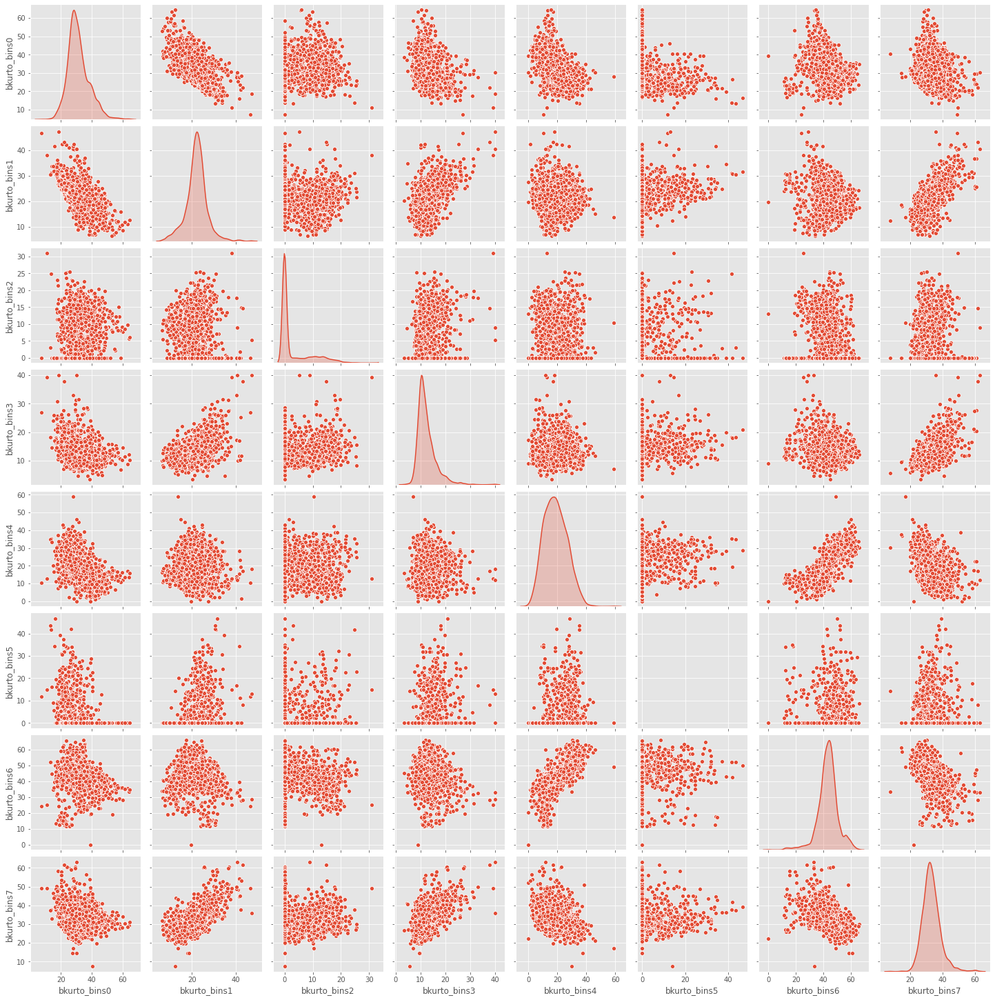

In [99]:
sns.pairplot(b.iloc[:, np.hstack((range(24, 32)))], diag_kind='kde')

C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\Admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


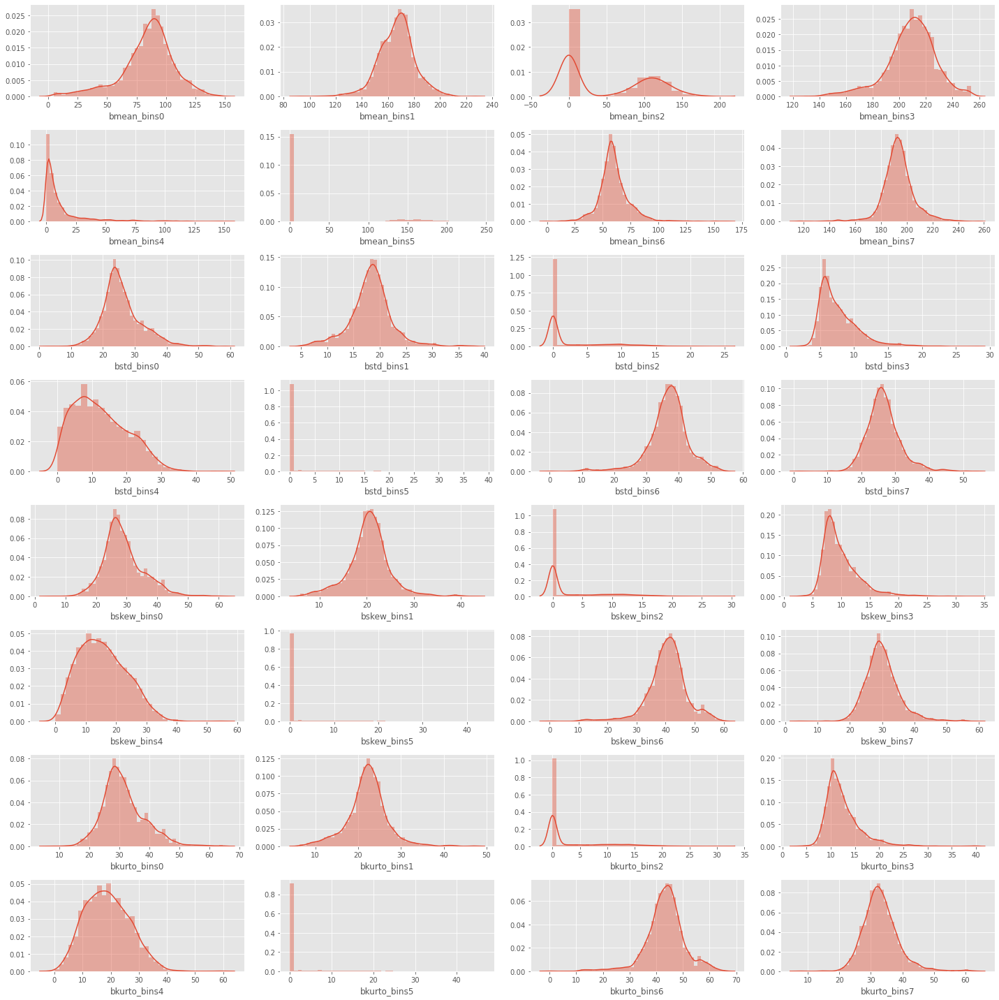

In [100]:
rows = 8
cols = 4

fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize= (20, 20))
col = b.columns
index = 0

for i in range(rows):
    for j in range(cols):
        sns.distplot(b[col[index]], ax = ax[i][j])
        index += 1

plt.tight_layout()

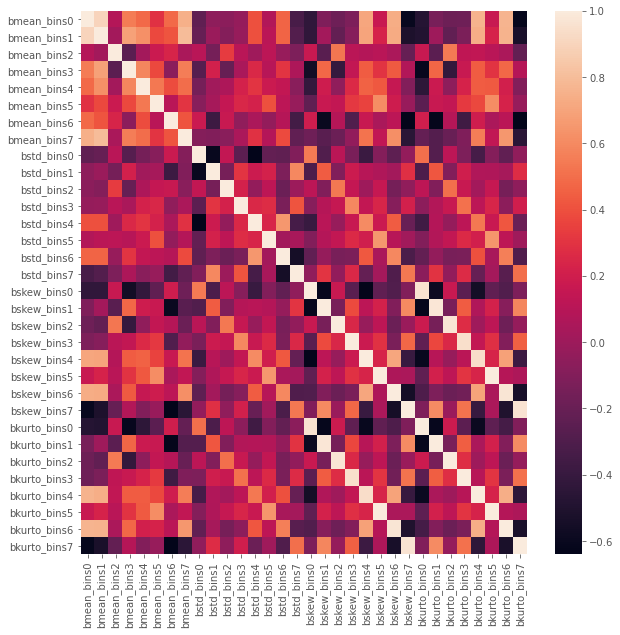

In [101]:
corrmat = b.corr()
fig, ax = plt.subplots(figsize = (10,10))
sns.heatmap(corrmat)

In [103]:
corr_df

,Correlation Values
class,1.0


In [106]:
corrmat = corrmat.abs().unstack() # absolute value of corr coef
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat[corrmat >= 0.5]
corrmat = corrmat[corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1', 'feature2', 'correlation values']
corrmat.head()

,feature1,feature2,correlation values
0,bkurto_bins5,bskew_bins5,0.997897
1,bskew_bins5,bkurto_bins5,0.997897
2,bskew_bins1,bkurto_bins1,0.980514
3,bkurto_bins1,bskew_bins1,0.980514
4,bkurto_bins2,bskew_bins2,0.970190


In [107]:
# find groups of correlated features

grouped_feature_ls = []
correlated_groups = []

for feature in corrmat.feature1.unique():
    
    if feature not in grouped_feature_ls:

        # find all features correlated to a single feature
        correlated_block = corrmat[corrmat.feature1 == feature]
        grouped_feature_ls = grouped_feature_ls + list(
            correlated_block.feature2.unique()) + [feature]

        # append the block of features to the list
        correlated_groups.append(correlated_block)

print('found {} correlated groups'.format(len(correlated_groups)))

found 8 correlated groups


In [108]:
for group in correlated_groups:
    print(group)
    print()

        feature1     feature2  correlation values
0   bkurto_bins5  bskew_bins5            0.997897
54  bkurto_bins5   bstd_bins5            0.642146
74  bkurto_bins5  bmean_bins5            0.615399

        feature1      feature2  correlation values
2    bskew_bins1  bkurto_bins1            0.980514
69   bskew_bins1  bkurto_bins0            0.617986
78   bskew_bins1   bskew_bins0            0.612030
97   bskew_bins1   bskew_bins7            0.602655
98   bskew_bins1   bmean_bins6            0.598794
109  bskew_bins1  bkurto_bins7            0.588507

         feature1     feature2  correlation values
4    bkurto_bins2  bskew_bins2            0.970190
133  bkurto_bins2  bmean_bins2            0.541965
161  bkurto_bins2   bstd_bins2            0.506072

         feature1      feature2  correlation values
6    bkurto_bins6   bskew_bins6            0.969819
20   bkurto_bins6   bmean_bins0            0.765559
23   bkurto_bins6   bmean_bins1            0.763049
30   bkurto_bins6  bkurto_bi